# Prediction Model for Adventure Hardware Group

In [2]:
# pip install sqlalchemy

In [3]:
# pip install --upgrade scikit-learn


In [4]:
# pip install plotly


In [5]:
# COMPLETE

# Basic Libraries
import numpy as np # for math computation, array/data prep
import pandas as pd # for importing data and wrangling
import matplotlib.pyplot as plt # for plotting/charts
#Plot styling
import seaborn as sns; sns.set()  # for plot styling
from datetime import datetime  #to convert string to datetime

# for Encoding
from sklearn.preprocessing import LabelEncoder # for nominal categorical column
from sklearn.preprocessing import OrdinalEncoder # for ordinal categorical column

# Needed to connect to the database
import pyodbc
from sqlalchemy import create_engine

# for oversampling of minority class

from sklearn.utils import resample

from sklearn.feature_selection import RFE   # For feature selection

In [6]:
# Machine Learning Modules from sklearn 
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, precision_score, recall_score, classification_report
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.pipeline import FeatureUnion, make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import model_selection
import matplotlib.pyplot as plt

import joblib # to save model
from sklearn.cluster import KMeans # import the algorithm for the unsupervised learning
import plotly.express as px # for 3d visuals
import plotly.graph_objects as go # for 3d visuals

In [7]:
# Establish a connection to my SQL Server database and also deriving a fn to fetch sql table:
def fetch_sql_table(table_name):
    
    conn = pyodbc.connect('Driver={SQL Server};'
                     'Server=OLUWASEUN;'
                      'Database=AdventureWorksDW2022;'
                      'Trusted_Connection=yes;'
                     )
    # Get our Table

    sql_for_df = f"Select dc.CustomerKey, fi.SalesOrderNumber, dc.YearlyIncome, DateDiff(yy,dc.BirthDate, '2014-12-31') as Age, dc.MaritalStatus, dc.Gender,dc.EnglishEducation as Education, dc.EnglishOccupation as Occupation, Case When dc.YearlyIncome between 10000 and 50000 then 'Low Income' When dc.YearlyIncome between 50001 and 100000 then 'Mid Income' When dc.YearlyIncome > 100000 then 'High Income' End as 'Income Segment', Case When dc.TotalChildren < 1 then 'No kids' When dc.TotalChildren between 1 and 2 then '1-2 kids' When dc.TotalChildren >2 then '3-5 kids' End as 'TotalChildren', Case When DateDiff(yy,dc.BirthDate, '2014-12-31') between 20 and 30 then '21-30' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 31 and 40 then '31-40' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 41 and 50 then '41-50' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 51 and 60 then '51-60' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 61 and 70 then '61-70' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 71 and 80 then '71-80' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 81 and 90 then '81-90' End as 'Age Group', dc.NumberChildrenAtHome, fi.SalesAmount, fi.OrderDate, fi.OrderQuantity from DimCustomer as dc left join FactInternetSales as fi on dc.CustomerKey = fi.CustomerKey"
                                
    #two parameters: 1. the dataset to extract
    #                2. the connection we created
    df = pd.read_sql(sql_for_df, conn)
    conn.close()
    
    
    return df


# Checking for missing values:

def missingValFinder(dataset):
    
    MissingReprt = []
    df = dataset
    cols = df.columns.tolist()
    MissingRecs = df.isnull().sum()
    
    for col, rec in zip(cols, MissingRecs):
        
        if rec > 0:
            MissingReprt.append(f'{col} has {rec} missing records')
        else:
            MissingReprt.append(f'{col} has no missing records')
            
            
    return MissingReprt



#Functions for Supervised Classification Performance Metrics

def plot_roc_curve(y_true, y_score):
    from sklearn.metrics import roc_curve, auc
    
    fpr, tpr, _ = roc_curve(y_true=y_true, y_score=y_score)
    roc_auc = auc(fpr, tpr)
    
    plt.figure(figsize=(9, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC (auc = {:0.2}'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")




def plot_confusion_matrix(cm, class_names):
    import itertools
   
    # commenting out the relative conf.matrix represntation
    cm = cm.astype(int)  / cm.sum(axis=1)[:, np.newaxis]
 
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion matrix')
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)
    
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        color = "white" if cm[i, j] > cm.max() / 2 else "black"
        plt.text(j, i, format(cm[i, j], '.2f'), horizontalalignment="center", color=color)
        
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
   
    plt.show()

### Data Import
#### Preliminary Exploratory data analysis

In [9]:
# Using the function created above to call DimCustomer table:

table_name = 'DimCustomer'

df = fetch_sql_table(table_name)

df.head()

C:\Users\emmas\AppData\Local\Temp\ipykernel_47120\461041162.py:15: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(sql_for_df, conn)


,CustomerKey,SalesOrderNumber,YearlyIncome,Age,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,NumberChildrenAtHome,SalesAmount,OrderDate,OrderQuantity
0,11000,SO43793,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,3399.99,2011-01-19,1
1,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2319.99,2013-01-18,1
2,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,21.98,2013-01-18,1
3,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2384.07,2013-05-03,1
4,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,28.99,2013-05-03,1


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60398 entries, 0 to 60397
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   CustomerKey           60398 non-null  int64         
 1   SalesOrderNumber      60398 non-null  object        
 2   YearlyIncome          60398 non-null  float64       
 3   Age                   60398 non-null  int64         
 4   MaritalStatus         60398 non-null  object        
 5   Gender                60398 non-null  object        
 6   Education             60398 non-null  object        
 7   Occupation            60398 non-null  object        
 8   Income Segment        60398 non-null  object        
 9   TotalChildren         60398 non-null  object        
 10  Age Group             60358 non-null  object        
 11  NumberChildrenAtHome  60398 non-null  int64         
 12  SalesAmount           60398 non-null  float64       
 13  OrderDate       

In [11]:
df.shape

(60398, 15)

Finding the unique values in our object dtype

In [13]:
df['Gender'].unique() # Find unique values from the dataset

array(['M', 'F'], dtype=object)

In [14]:
df['MaritalStatus'].unique() # Find unique values from the dataset

array(['M', 'S'], dtype=object)

In [15]:
df['Education'].unique() # Find unique values from the dataset

array(['Bachelors', 'Partial College', 'High School',
       'Partial High School', 'Graduate Degree'], dtype=object)

In [16]:
df['Occupation'].unique() # Find unique values from the dataset

array(['Professional', 'Management', 'Skilled Manual', 'Clerical',
       'Manual'], dtype=object)

In [17]:
df['Income Segment'].unique() # Find unique values from the dataset

array(['Mid Income', 'Low Income', 'High Income'], dtype=object)

In [18]:
df['Age Group'].unique() # Find unique values from the dataset

array(['41-50', '31-40', '21-30', '61-70', '51-60', '71-80', '81-90',
       None], dtype=object)

In [19]:
df['TotalChildren'].unique() # Find unique values from the dataset

array(['1-2 kids', '3-5 kids', 'No kids'], dtype=object)

In [20]:
# Convert the date column to a standard format
df['OrderDate'] = pd.to_datetime(df['OrderDate'], errors='coerce')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60398 entries, 0 to 60397
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   CustomerKey           60398 non-null  int64         
 1   SalesOrderNumber      60398 non-null  object        
 2   YearlyIncome          60398 non-null  float64       
 3   Age                   60398 non-null  int64         
 4   MaritalStatus         60398 non-null  object        
 5   Gender                60398 non-null  object        
 6   Education             60398 non-null  object        
 7   Occupation            60398 non-null  object        
 8   Income Segment        60398 non-null  object        
 9   TotalChildren         60398 non-null  object        
 10  Age Group             60358 non-null  object        
 11  NumberChildrenAtHome  60398 non-null  int64         
 12  SalesAmount           60398 non-null  float64       
 13  OrderDate       

In [21]:
df.describe() # Applies to columns with numerical datasypes

,CustomerKey,YearlyIncome,Age,NumberChildrenAtHome,SalesAmount,OrderDate,OrderQuantity
count,60398.000000,60398.000000,60398.000000,60398.000000,60398.000000,60398,60398.0
mean,18841.685420,59715.056790,45.098199,1.080317,486.086911,2013-06-09 12:21:38.903937024,1.0
min,11000.000000,10000.000000,28.000000,0.000000,2.290000,2010-12-29 00:00:00,1.0
25%,14003.000000,30000.000000,36.000000,0.000000,7.950000,2013-04-03 00:00:00,1.0
50%,18143.000000,60000.000000,43.000000,0.000000,29.990000,2013-07-14 00:00:00,1.0
75%,23429.750000,80000.000000,53.000000,2.000000,539.990000,2013-10-18 00:00:00,1.0
max,29483.000000,170000.000000,98.000000,5.000000,3578.270000,2014-01-28 00:00:00,1.0
std,5432.430404,33065.426837,11.343832,1.585964,928.489892,NaN,0.0


<Axes: >

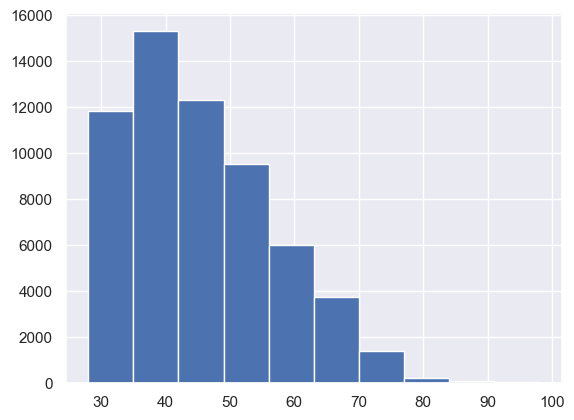

In [22]:
# Checking the distribution of age:

df['Age'].hist()

<Axes: >

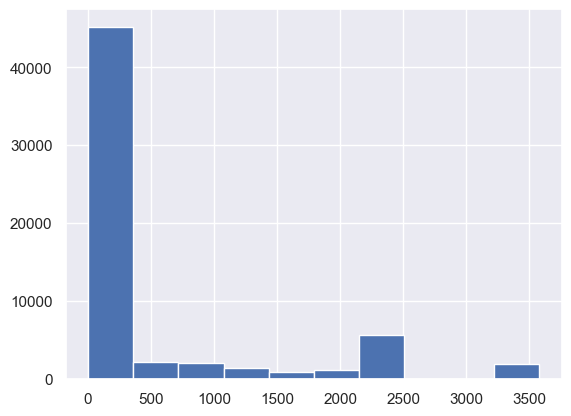

In [23]:
# Checking the distribution of SalesAmount:

df['SalesAmount'].hist()

<Axes: >

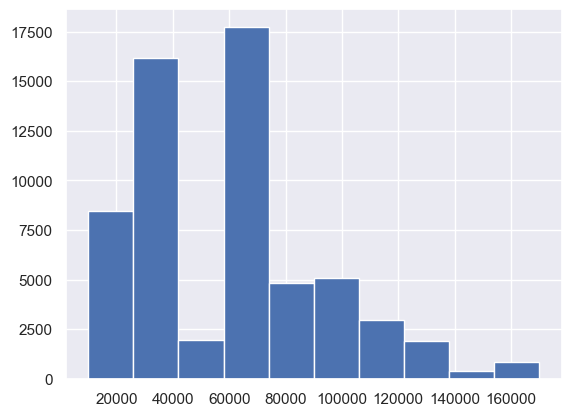

In [24]:
# Checking the distribution of YearlyIncome:

df['YearlyIncome'].hist()

#### Data wranggling

In [26]:
# Checking for missing value in our dataset:
missingValFinder(df)

['CustomerKey has no missing records',
 'SalesOrderNumber has no missing records',
 'YearlyIncome has no missing records',
 'Age has no missing records',
 'MaritalStatus has no missing records',
 'Gender has no missing records',
 'Education has no missing records',
 'Occupation has no missing records',
 'Income Segment has no missing records',
 'TotalChildren has no missing records',
 'Age Group has 40 missing records',
 'NumberChildrenAtHome has no missing records',
 'SalesAmount has no missing records',
 'OrderDate has no missing records',
 'OrderQuantity has no missing records']

In [27]:
df.describe(include=object)

,SalesOrderNumber,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group
count,60398,60398,60398,60398,60398,60398,60398,60358
unique,27659,2,2,5,5,3,3,7
top,SO58845,M,M,Bachelors,Professional,Mid Income,1-2 kids,31-40
freq,8,33273,30381,18144,18995,27683,23846,21239


 To deal with the missing value in the age group column, we would replace the missing values in the Age group column with the MODE (more frequently occuring) value, here "31-40"

In [29]:


# Calculate the mode of the 'Age Group' column
mode_value = df['Age Group'].mode()[0]
print("\nMode of 'Age Group' column:", mode_value)

# Fill missing values in the 'Age Group' column with the mode
# df['Age Group'].fillna(mode_value, inplace=True)

df.fillna({'Age Group': '31-40'}, inplace=True)


Mode of 'Age Group' column: 31-40


In [30]:
missingValFinder(df)

['CustomerKey has no missing records',
 'SalesOrderNumber has no missing records',
 'YearlyIncome has no missing records',
 'Age has no missing records',
 'MaritalStatus has no missing records',
 'Gender has no missing records',
 'Education has no missing records',
 'Occupation has no missing records',
 'Income Segment has no missing records',
 'TotalChildren has no missing records',
 'Age Group has no missing records',
 'NumberChildrenAtHome has no missing records',
 'SalesAmount has no missing records',
 'OrderDate has no missing records',
 'OrderQuantity has no missing records']

To get the unique values for all the object dtype columns

In [32]:
#Using a for loop to check the unique features in our categorical columns:

#create a list of categorical columns
cat_cols = [i for i in df.columns if df[i].dtype==object]




# lets have a look at the categories and their distribution in all categorical columns.
for i in cat_cols:
	print('Column Name: ', i)
	print(df[i].value_counts())
	print('--------------------')

Column Name:  SalesOrderNumber
SalesOrderNumber
SO58845    8
SO70714    8
SO72656    8
SO74869    7
SO61412    7
          ..
SO70429    1
SO60790    1
SO72021    1
SO58440    1
SO49665    1
Name: count, Length: 27659, dtype: int64
--------------------
Column Name:  MaritalStatus
MaritalStatus
M    33273
S    27125
Name: count, dtype: int64
--------------------
Column Name:  Gender
Gender
M    30381
F    30017
Name: count, dtype: int64
--------------------
Column Name:  Education
Education
Bachelors              18144
Partial College        16623
Graduate Degree        10603
High School            10320
Partial High School     4708
Name: count, dtype: int64
--------------------
Column Name:  Occupation
Occupation
Professional      18995
Skilled Manual    14261
Management        10594
Clerical           9624
Manual             6924
Name: count, dtype: int64
--------------------
Column Name:  Income Segment
Income Segment
Mid Income     27683
Low Income     26632
High Income     6083
Nam

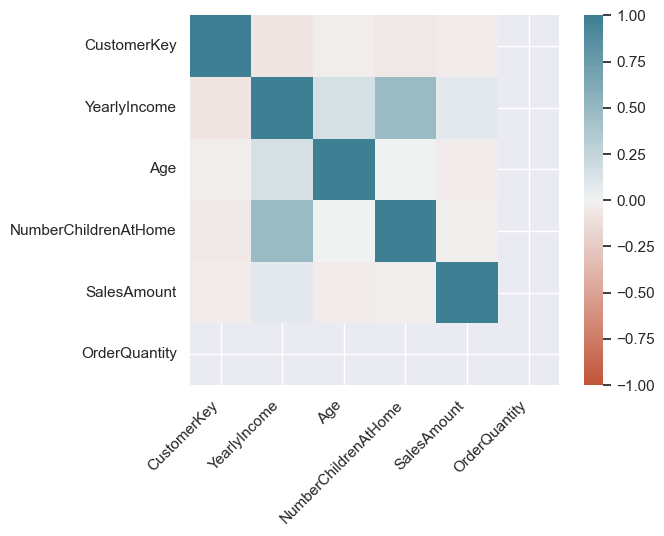

In [33]:
# feature correlation

corr = df.select_dtypes(include=np.number).corr() # correlation values in our imported data

# produce a heatmap of the correlation values
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)

# adding labelling to our chart
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [34]:
df.head()

,CustomerKey,SalesOrderNumber,YearlyIncome,Age,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,NumberChildrenAtHome,SalesAmount,OrderDate,OrderQuantity
0,11000,SO43793,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,3399.99,2011-01-19,1
1,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2319.99,2013-01-18,1
2,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,21.98,2013-01-18,1
3,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2384.07,2013-05-03,1
4,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,28.99,2013-05-03,1


### EDA to understand the profile of churners based on using demographic, transactional and attitudinal data.
our data has no "natural" target/label, so we synthetically create one based on the churn condition of 8 months before the last orderdate

In [36]:
# Remove duplicates based on all columns
df = df.drop_duplicates()
df.shape

(59990, 15)

In [37]:
# This is to know the last date in our data set
max_date = df['OrderDate'].max()

max_date

Timestamp('2014-01-28 00:00:00')

In [38]:
# This is to know the minimum date date in our data set
df['OrderDate'].min()

Timestamp('2010-12-29 00:00:00')

In [39]:
# The 8th month before the last order date is '2013-05-28 00:00:00' which needs to be converted to date time to 
#allow us calculate the churchFlag

In [40]:
# String to be converted
date_string = '2013-05-28 00:00:00'

# Convert string to datetime object
churn_date = datetime.strptime(date_string, '%Y-%m-%d %H:%M:%S')

In [41]:
(max_date - churn_date).days # shows the number of days between the last transaction day in our data set and the churn date defined (Which is 8 months before)

245

In [42]:
# To define our churnFlag, any customer that does not order after this date '2013-05-28 00:00:00' has churned:
# which means, any customer that has (the diff between their last order date and the max date in our dataset) greater than
# (diff between the max date in our data set and the defined churned date) has churned which is represented as 1 and 0 if it is less than or equal to.

df["ChurnFlag"] = df['OrderDate'].map(lambda orderdate: 1 if (max_date - orderdate).days > (max_date - churn_date).days else 0)
df.head()

,CustomerKey,SalesOrderNumber,YearlyIncome,Age,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,NumberChildrenAtHome,SalesAmount,OrderDate,OrderQuantity,ChurnFlag
0,11000,SO43793,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,3399.99,2011-01-19,1,1
1,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2319.99,2013-01-18,1,1
2,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,21.98,2013-01-18,1,1
3,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2384.07,2013-05-03,1,1
4,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,28.99,2013-05-03,1,1


In [43]:
# This is to know the total number of customers that churned

df['ChurnFlag'].sum()

22423

In [44]:
# To Calculate the churn rate using the simple churn rate calculation
total_customers_beginning = len(df)
churned_customers = df['ChurnFlag'].sum()  # Since customers who churned is represented with 1
simple_churn_rate = (churned_customers / total_customers_beginning) * 100

print(f'The rate at which customers churned is {simple_churn_rate}')

The rate at which customers churned is 37.37789631605268


In [45]:
# # now drop the OrderDate column
# df.drop("OrderDate", axis = 1, inplace = True)
# df.head() # check

#### Age Group EDA

Text(0.5, 1.0, 'Churn')

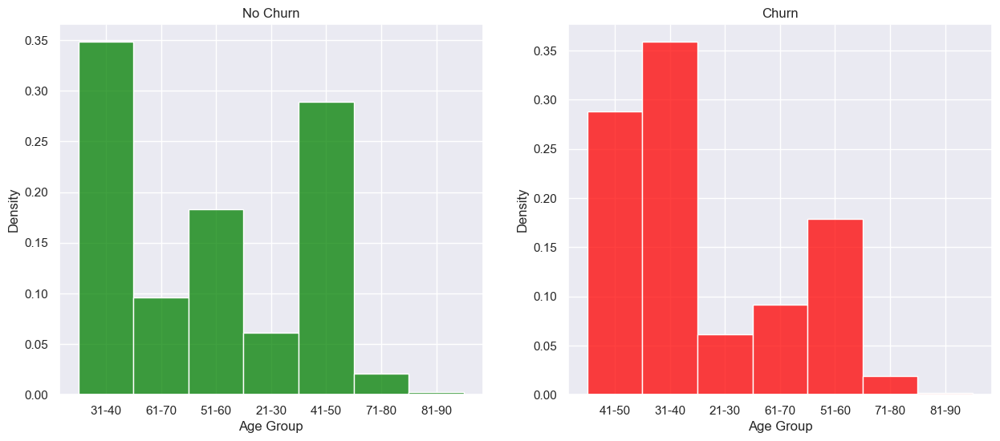

In [47]:
# using our Age group column, we want to know the age group that churned the most

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Plotting the histogram for our no Churn (represented by 0)
ax1 = sns.histplot(x='Age Group', data=df[df['ChurnFlag'] == 0],
                  stat='density', ax=ax1, color='green') 

# Plotting the histogram for Churn (represented by 1)
ax2 = sns.histplot(x='Age Group', data=df[df['ChurnFlag'] == 1],
                  stat='density',  ax=ax2, color='red') 

ax1.set_title('No Churn')
ax2.set_title('Churn')

In [48]:
# to know the age group with most churn

churn_agegroup = df.groupby('Age Group')['ChurnFlag'].sum()
churn_agegroup

Age Group
21-30    1385
31-40    8046
41-50    6461
51-60    4003
61-70    2061
71-80     432
81-90      35
Name: ChurnFlag, dtype: int64

In [49]:
# while using our Age group column, we want to know the age group that has the least and the most Churn

highest_churn = churn_agegroup.idxmax() # the index with the highest (max)
 
lowest_churn = churn_agegroup.idxmin() # the index with the lowest (min)
 
print(f'The highest churn age group is {highest_churn} \nWhile the lowest churn age group is {lowest_churn}')

The highest churn age group is 31-40 
While the lowest churn age group is 81-90


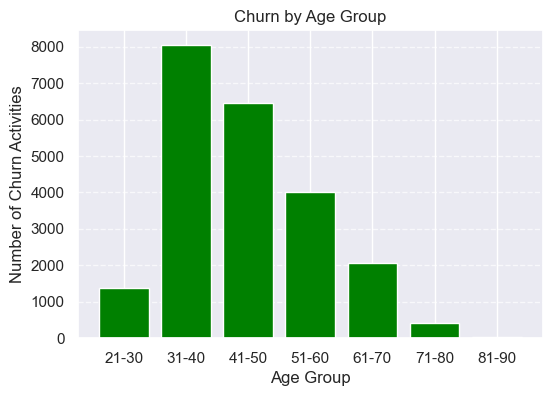

In [50]:
# Uisng visualization to explore this further.
# histogram representation - matplotlib
 
plt.figure(figsize=(6, 4))
plt.bar(churn_agegroup.index, churn_agegroup.values, color='green')
plt.xlabel('Age Group')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by Age Group')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#### Income segment EDA


In [52]:
# to know the Income Segment with most churn

churn_Income_Segment = df.groupby('Income Segment')['ChurnFlag'].sum()
churn_Income_Segment

Income Segment
High Income     2309
Low Income      9839
Mid Income     10275
Name: ChurnFlag, dtype: int64

In [53]:
# while using our Income segment column, we want to know the income segment that has the least and the most Churn

highest_churn = churn_Income_Segment.idxmax() # the index with the highest (max)
 
lowest_churn = churn_Income_Segment.idxmin() # the index with the lowest (min)
 
print(f'The highest churn Income Segment is {highest_churn} \nWhile the lowest churn Income Segment is {lowest_churn}')

The highest churn Income Segment is Mid Income 
While the lowest churn Income Segment is High Income


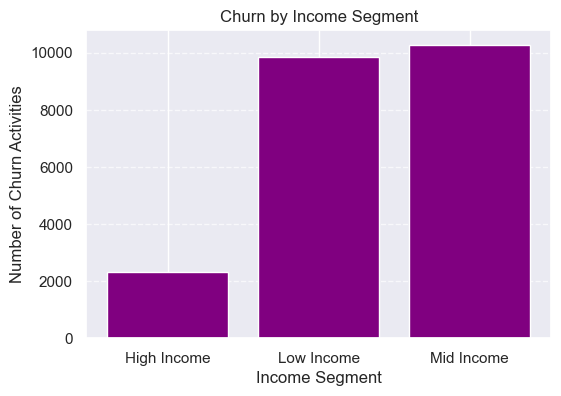

In [54]:
# Uisng visualization to explore this further.
# histogram representation - matplotlib
 
plt.figure(figsize=(6, 4))
plt.bar(churn_Income_Segment.index, churn_Income_Segment.values, color='purple')
plt.xlabel('Income Segment')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by Income Segment')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#### Total Children EDA

In [56]:
# to know the totalchildren of a customer with most churn

churn_TotalChildren = df.groupby('TotalChildren')['ChurnFlag'].sum()
churn_TotalChildren

TotalChildren
1-2 kids    9046
3-5 kids    6918
No kids     6459
Name: ChurnFlag, dtype: int64

In [57]:
# while using our TotalChildren column, we want to know the TotalChildren per customer that has the least and the most Churn

highest_churn = churn_TotalChildren.idxmax() # the index with the highest (max)
 
lowest_churn = churn_TotalChildren.idxmin() # the index with the lowest (min)
 
print(f'The highest churn by TotalChildren of customer is {highest_churn} \nWhile the lowest churn by TotalChildren of customer is {lowest_churn}')

The highest churn by TotalChildren of customer is 1-2 kids 
While the lowest churn by TotalChildren of customer is No kids


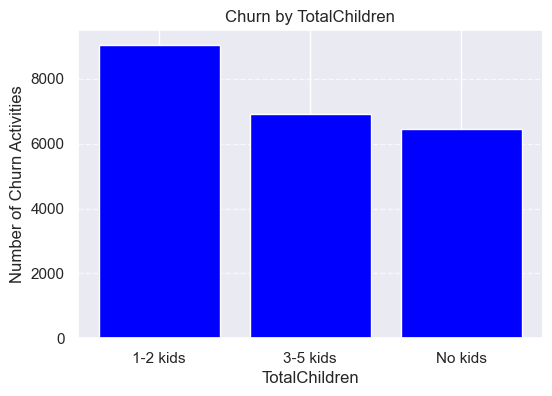

In [58]:
# Uisng visualization to explore this further.
# histogram representation - matplotlib
 
plt.figure(figsize=(6, 4))
plt.bar(churn_TotalChildren.index, churn_TotalChildren.values, color='blue')
plt.xlabel('TotalChildren')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by TotalChildren')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#### Gender EDA

In [60]:
# to know the Gender with most churn

churn_Gender = df.groupby('Gender')['ChurnFlag'].sum()
churn_Gender

Gender
F    11175
M    11248
Name: ChurnFlag, dtype: int64

In [61]:
# while using our TotalChildren column, we want to know the TotalChildren per customer that has the least and the most Churn

highest_churn = churn_Gender.idxmax() # the index with the highest (max)
 
lowest_churn = churn_Gender.idxmin() # the index with the lowest (min)
 
print(f'The highest churn by Gender of customer is {highest_churn} \nWhile the lowest churn by Gender of customer is {lowest_churn}')

The highest churn by Gender of customer is M 
While the lowest churn by Gender of customer is F


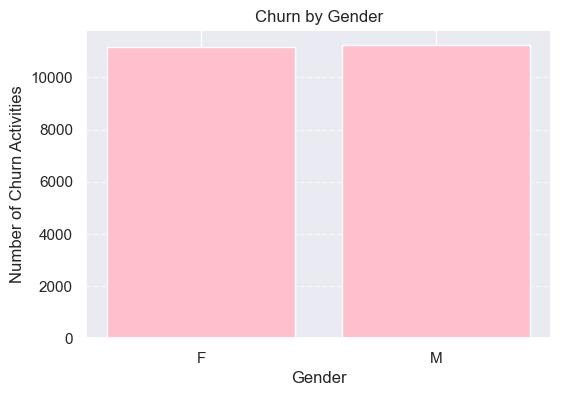

In [62]:
# Uisng visualization to explore this further.
# histogram representation - matplotlib
 
plt.figure(figsize=(6, 4))
plt.bar(churn_Gender.index, churn_Gender.values, color='pink')
plt.xlabel('Gender')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by Gender')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#### MaritalStatus EDA

In [64]:
# to know the MaritalStatus with most churn

churn_MaritalStatus = df.groupby('MaritalStatus')['ChurnFlag'].sum()
churn_MaritalStatus

MaritalStatus
M    12168
S    10255
Name: ChurnFlag, dtype: int64

In [65]:
# while using our MaritalStatus column, we want to know the MaritalStatus per customer that has the least and the most Churn

highest_churn = churn_MaritalStatus.idxmax() # the index with the highest (max)
 
lowest_churn = churn_MaritalStatus.idxmin() # the index with the lowest (min)
 
print(f'The highest churn by Marital status of customer is {highest_churn} \nWhile the lowest churn by Marital status of customer is {lowest_churn}')

The highest churn by Marital status of customer is M 
While the lowest churn by Marital status of customer is S


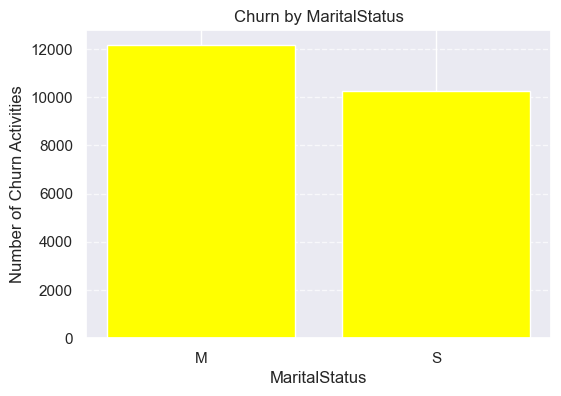

In [66]:
# Uisng visualization to explore this further.
# histogram representation - matplotlib
 
plt.figure(figsize=(6, 4))
plt.bar(churn_MaritalStatus.index, churn_MaritalStatus.values, color='yellow')
plt.xlabel('MaritalStatus')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by MaritalStatus')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#### Education EDA

In [68]:
# to know the Education of customers with most churn

churn_Education = df.groupby('Education')['ChurnFlag'].sum()
churn_Education

Education
Bachelors              6849
Graduate Degree        4092
High School            3747
Partial College        6013
Partial High School    1722
Name: ChurnFlag, dtype: int64

In [69]:
# while using our Education column, we want to know the Education per customer that has the least and the most Churn

highest_churn = churn_Education.idxmax() # the index with the highest (max)
 
lowest_churn = churn_Education.idxmin() # the index with the lowest (min)
 
print(f'The highest churn by Education of customer is {highest_churn} \nWhile the lowest churn by Education of customer is {lowest_churn}')

The highest churn by Education of customer is Bachelors 
While the lowest churn by Education of customer is Partial High School


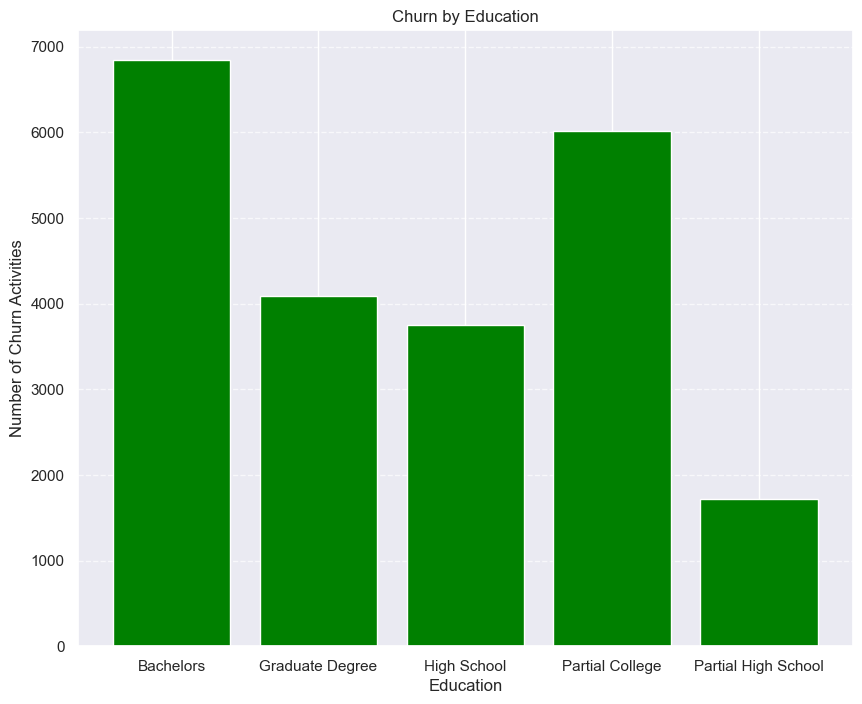

In [70]:
# Uisng visualization to explore this further.
# histogram representation - matplotlib
 
plt.figure(figsize=(10, 8))
plt.bar(churn_Education.index, churn_Education.values, color='green')
plt.xlabel('Education')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by Education')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#### Occupation EDA

In [72]:
# to know the Occupation of customers with most churn

churn_Occupation = df.groupby('Occupation')['ChurnFlag'].sum()
churn_Occupation

Occupation
Clerical          3596
Management        3952
Manual            2484
Professional      6945
Skilled Manual    5446
Name: ChurnFlag, dtype: int64

In [73]:
# while using our Occupation column, we want to know the Occupation per customer that has the least and the most Churn

highest_churn = churn_Occupation.idxmax() # the index with the highest (max)
 
lowest_churn = churn_Occupation.idxmin() # the index with the lowest (min)
 
print(f'The highest churn by Occupation of customer is {highest_churn} \nWhile the lowest churn by Occupation of customer is {lowest_churn}')

The highest churn by Occupation of customer is Professional 
While the lowest churn by Occupation of customer is Manual


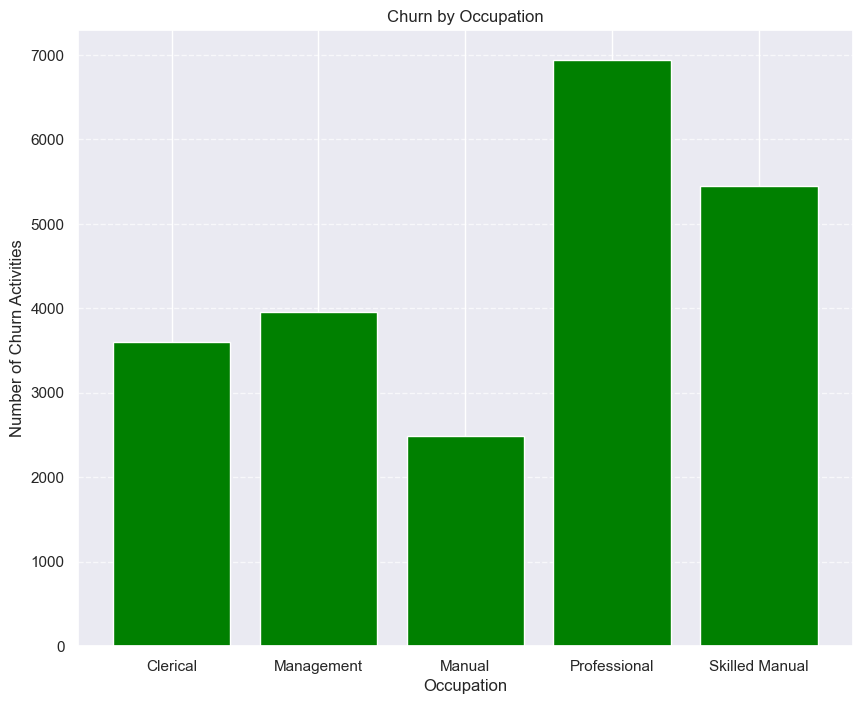

In [74]:
# Uisng visualization to explore this further.
# histogram representation - matplotlib
 
plt.figure(figsize=(10, 8))
plt.bar(churn_Occupation.index, churn_Occupation.values, color='green')
plt.xlabel('Occupation')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by Occupation')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [75]:
df.shape

(59990, 16)

### RFM Analysis

To calculate our RFM, we need to calculate our present date, Recency, Frequency and Monetary, will perform the followin operations:
For Recency, Calculate the number of days between present date and date of last purchase each customer. 
For Frequency, Calculate the number of orders for each customer.- 
For Monetary, Calculate sum of purchase price for each customer.

##### Filter required Columns

Here, we can filter the necessary columns for RFM analysis. We only need 4 columns 'CustomerKey','SalesOrderNumber','OrderDate', 'SalesAmount'. CustomerKey will uniquely define our customers, OrderDate help us calculate recency of purchase, SalesOrderNumber helps  to count the number of time transaction performed(frequency) and finally the SalesAmount which is a product of quantity ordered and unit price.

In [78]:
df_rfm = df[['CustomerKey','SalesOrderNumber','OrderDate', 'SalesAmount']]


In [79]:
df_rfm.head()

,CustomerKey,SalesOrderNumber,OrderDate,SalesAmount
0,11000,SO43793,2011-01-19,3399.99
1,11000,SO51522,2013-01-18,2319.99
2,11000,SO51522,2013-01-18,21.98
3,11000,SO57418,2013-05-03,2384.07
4,11000,SO57418,2013-05-03,28.99


In [80]:
# To know our maximum and minimum date in our dataset

df_rfm['OrderDate'].min(),df_rfm['OrderDate'].max()


(Timestamp('2010-12-29 00:00:00'), Timestamp('2014-01-28 00:00:00'))

In [81]:
# We need to calculate our present date which would be a day after the max date in our data set


# String to be converted
present_date_string = '2014-01-29 00:00:00'

# Convert string to datetime object
PRESENT = datetime.strptime(present_date_string, '%Y-%m-%d %H:%M:%S')


df_rfm['OrderDate'] = pd.to_datetime(df_rfm['OrderDate'])


C:\Users\emmas\AppData\Local\Temp\ipykernel_47120\4133073563.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rfm['OrderDate'] = pd.to_datetime(df_rfm['OrderDate'])


In [82]:
df_rfm.head()

,CustomerKey,SalesOrderNumber,OrderDate,SalesAmount
0,11000,SO43793,2011-01-19,3399.99
1,11000,SO51522,2013-01-18,2319.99
2,11000,SO51522,2013-01-18,21.98
3,11000,SO57418,2013-05-03,2384.07
4,11000,SO57418,2013-05-03,28.99


In [83]:
# Now let's create our RFM df

In [84]:
rfm= df_rfm.groupby('CustomerKey').agg({'OrderDate': lambda date: (PRESENT - date.max()).days,
                                        'SalesOrderNumber': lambda num: len(num),
                                        'SalesAmount': lambda price: price.sum()})


In [85]:
rfm.columns

Index(['OrderDate', 'SalesOrderNumber', 'SalesAmount'], dtype='object')

In [86]:
# Change the name of columns 

rfm.columns=['recency', 'frequency', 'monetary'] 

In [87]:
rfm['recency'] = rfm['recency'].astype(int)


In [88]:
rfm.head()



,recency,frequency,monetary
CustomerKey,,,
11000,271,8,8248.99
11001,50,11,6383.88
11002,340,4,8114.04
11003,264,9,8139.29
11004,273,6,8196.01


#### Computing Quantile of RFM values
Customers with the lowest recency, highest frequency and monetary amounts considered as top customers.

qcut() is Quantile-based discretization function. qcut bins the data based on sample quantiles. For example, 1000 values for 4 quantiles would produce a categorical object indicating quantile membership for each customer.

In [90]:
# Add segment bin values to RFM table using quartile.


rfm['r_quartile'] = pd.qcut(rfm['recency'], 4, ['1','2','3','4'])
rfm['f_quartile'] = pd.qcut(rfm['frequency'], 4, ['4','3','2','1'])
rfm['m_quartile'] = pd.qcut(rfm['monetary'], 4, ['4','3','2','1'])


In [91]:
rfm.head()


,recency,frequency,monetary,r_quartile,f_quartile,m_quartile
CustomerKey,,,,,,
11000,271,8,8248.99,4,1,1
11001,50,11,6383.88,1,1,1
11002,340,4,8114.04,4,2,1
11003,264,9,8139.29,3,1,1
11004,273,6,8196.01,4,1,1


In [92]:
# Combine all three quartiles(r_quartile,f_quartile,m_quartile) in a single column, this rank will help you to segment the customers well group.

rfm['RFM_Score'] = rfm.r_quartile.astype(str)+ rfm.f_quartile.astype(str) + rfm.m_quartile.astype(str)
rfm.head()



,recency,frequency,monetary,r_quartile,f_quartile,m_quartile,RFM_Score
CustomerKey,,,,,,,
11000,271,8,8248.99,4,1,1,411
11001,50,11,6383.88,1,1,1,111
11002,340,4,8114.04,4,2,1,421
11003,264,9,8139.29,3,1,1,311
11004,273,6,8196.01,4,1,1,411


In [93]:
# Sort the customer RFM score in ascending order.

In [94]:
# Filter out Top/Best cusotmers

rfm[rfm['RFM_Score']=='111'].sort_values('monetary', ascending=False).head()


,recency,frequency,monetary,r_quartile,f_quartile,m_quartile,RFM_Score
CustomerKey,,,,,,,
12301,70,13,13295.3800,1,1,1,111
12308,71,14,13269.2700,1,1,1,111
12321,69,15,13215.6500,1,1,1,111
12307,73,11,13173.1900,1,1,1,111
11417,45,17,11248.4582,1,1,1,111


# Unsupervised Machine Learning

GOAL: explore customer data  and apply an UNSUPERVISED ML technique to group (cluster) our customers. Typically this process then feeds into a marketing team to send out TARGETED campaigns to the customers in each cluster. Our focus is on the calculated RFM scores and our customerID.

In [97]:
# Use only the RFM scores for clustering
rfm_data = rfm[['recency', 'frequency', 'monetary']]

rfm_data.head()

,recency,frequency,monetary
CustomerKey,,,
11000,271,8,8248.99
11001,50,11,6383.88
11002,340,4,8114.04
11003,264,9,8139.29
11004,273,6,8196.01


In [98]:
%matplotlib inline
# plots charts inline as we run the code

plt.rcParams['figure.figsize'] = (10, 7) # inches
plt.style.use('ggplot') # formatting borrowed from the R programming language

In [99]:
X = rfm_data.values # big "X" as our features
#NB this needs to be dataset.values as we apply a numpy technique below

In [100]:
#Using the elbow method to find the optimum number of clusters



wcss = [] # within cluster sum of squares WE WANT TO MINIMISE THIS

# for k = 1 to 10
for i in range(1,11):
    # defining the Unsupervised model (KMeans) with i clusters
    # n-init is like K-Folds CV - will randomly assign cluster centres (centroids) 10*
    km=KMeans(n_clusters=i,init='k-means++', max_iter=300, n_init=10, random_state=0)
    km.fit(X) # fit the model to our data X
    wcss.append(km.inertia_) # gather up the calculated within cluster sum of squares

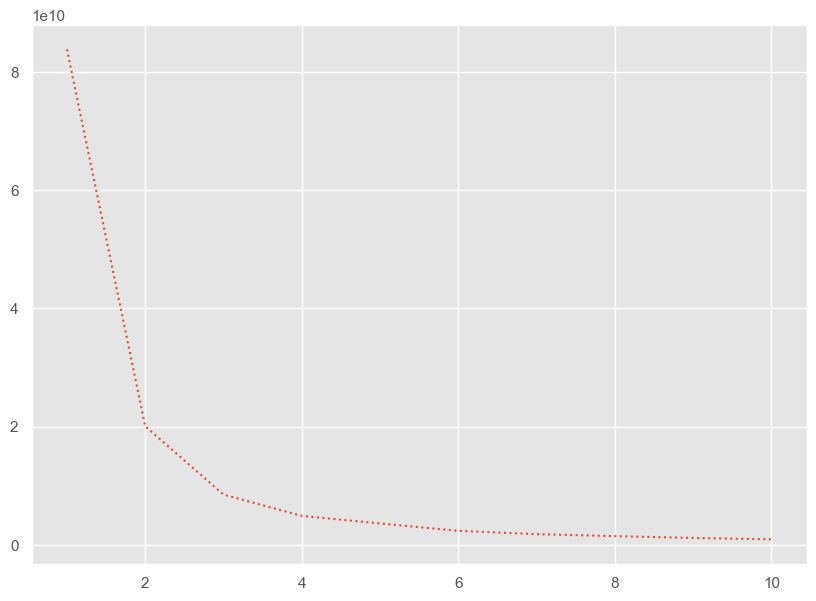

In [101]:
# plotting variation of WCSS for k = 1 to 10

plt.plot(range(1,11), wcss, linestyle = 'dotted')
plt.show()

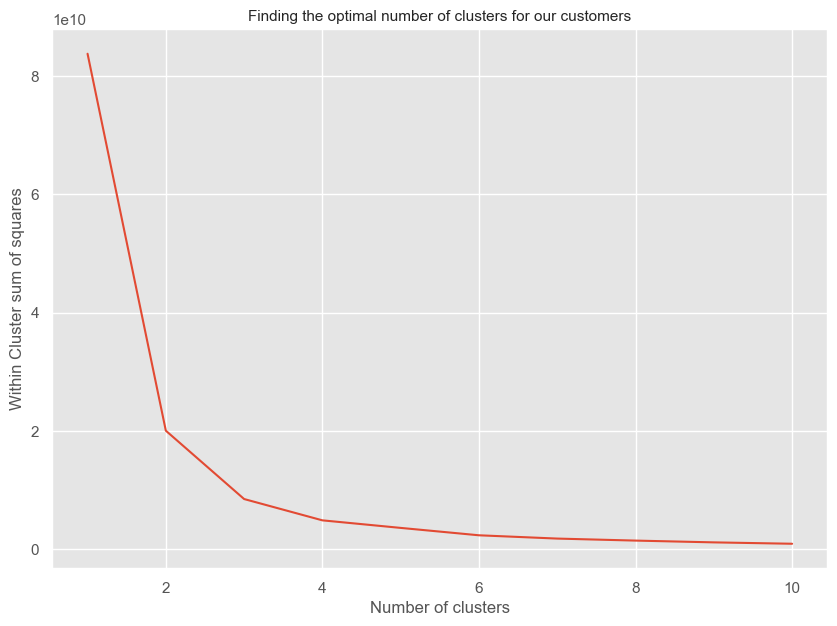

In [102]:
# better plot
plt.plot(range(1,11), wcss)

plt.title("Finding the optimal number of clusters for our customers", 
          fontdict={'fontsize': 11})

plt.xlabel("Number of clusters")
plt.ylabel("Within Cluster sum of squares")
plt.show()

idea is to look for an INFLECTION point in the "elbow plot" - this is a point on the curve where the rate of change of wcss "slows down"

we will try k=3 first as the rate of change has slowed and k=3 will have a relatively low cost overhead in terms of marketing to these customer groups

##### Fit the model

In [105]:
# Standardize the RFM data
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_data)

# Display the standardized RFM data
print("\nStandardized RFM Data:")
print(rfm_scaled)

# Apply K-means clustering where k=3 based on our elbow plot
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(rfm_scaled)

# Get the cluster labels
labels = kmeans.labels_

# Display the cluster labels
print("\nCluster Labels:")
print(labels)

# Add the cluster labels to the original DataFrame
rfm['Cluster'] = labels

# Display the DataFrame with cluster labels
print("\nDataFrame with Cluster Labels:")
print(rfm)


Standardized RFM Data:
[[ 0.55144188  1.83271725  3.13581115]
 [-0.95931003  2.98912967  2.2577469 ]
 [ 1.02312461  0.29083401  3.07227883]
 ...
 [ 4.85127426 -0.86557841  0.84120913]
 [ 2.10320969 -0.86557841  0.21700027]
 [ 2.16473352 -0.86557841  0.21700027]]

Cluster Labels:
[0 0 0 ... 1 1 1]

DataFrame with Cluster Labels:
             recency  frequency   monetary r_quartile f_quartile m_quartile  \
CustomerKey                                                                   
11000            271          8  8248.9900          4          1          1   
11001             50         11  6383.8800          1          1          1   
11002            340          4  8114.0400          4          2          1   
11003            264          9  8139.2900          3          1          1   
11004            273          6  8196.0100          4          1          1   
...              ...        ...        ...        ...        ...        ...   
29479            512          1  2049

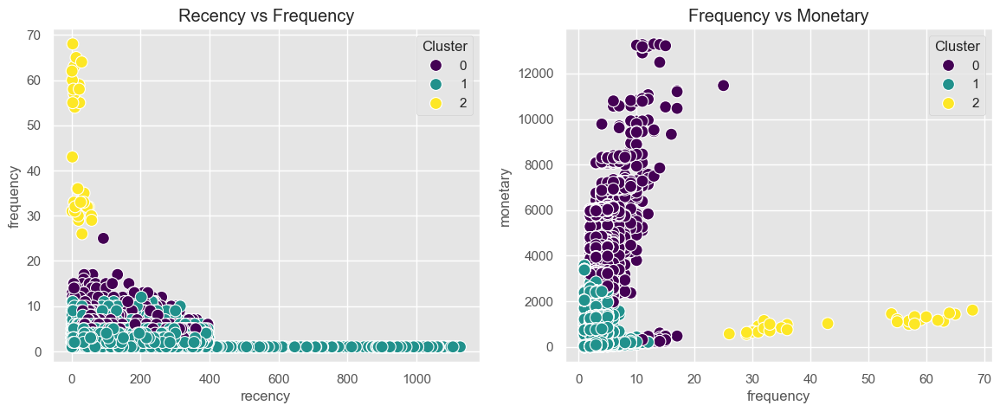

In [106]:
#Create a 2D scatter plot for each pair of RFM scores
plt.figure(figsize=(14, 5))

# Recency vs Frequency
plt.subplot(1, 2, 1)
sns.scatterplot(data=rfm, x='recency', y='frequency', hue='Cluster', palette='viridis', s=100)
plt.title('Recency vs Frequency')

# Frequency vs Monetary
plt.subplot(1, 2, 2)
sns.scatterplot(data=rfm, x='frequency', y='monetary', hue='Cluster', palette='viridis', s=100)
plt.title('Frequency vs Monetary')

plt.show()

In [107]:
# Create a 3D scatter plot using Plotly for a better view

In [108]:
# Select the CustomerKey (index) and other columns
new_rfm = rfm[['recency', 'frequency', 'monetary']].copy()
new_rfm['CustomerKey'] = new_rfm.index

# Reset the index to make CustomerKey a column again
new_rfm = new_rfm.reset_index(drop=True)

# Rearrange columns to have CustomerID first
new_rfm = new_rfm[['CustomerKey', 'recency', 'frequency', 'monetary']]

new_rfm.head()

,CustomerKey,recency,frequency,monetary
0,11000,271,8,8248.99
1,11001,50,11,6383.88
2,11002,340,4,8114.04
3,11003,264,9,8139.29
4,11004,273,6,8196.01


In [109]:
# Add the cluster labels to the original DataFrame
new_rfm['Cluster'] = labels

# Display the DataFrame with cluster labels
new_rfm.head()

,CustomerKey,recency,frequency,monetary,Cluster
0,11000,271,8,8248.99,0
1,11001,50,11,6383.88,0
2,11002,340,4,8114.04,0
3,11003,264,9,8139.29,0
4,11004,273,6,8196.01,0


In [110]:
new_rfm['Cluster'].value_counts()

Cluster
1    14327
0     4122
2       35
Name: count, dtype: int64

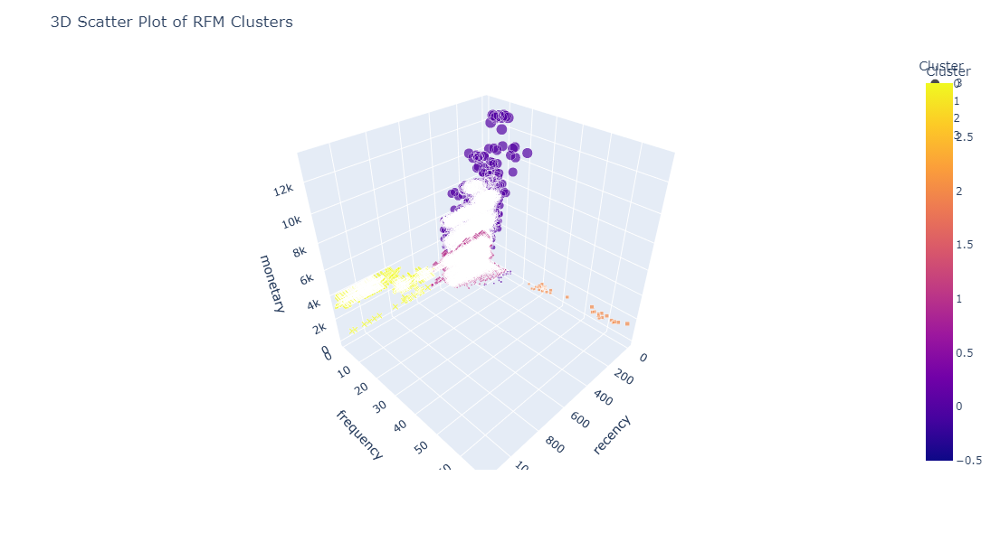

In [783]:

fig = px.scatter_3d(new_rfm, x='recency', y='frequency', z='monetary', color='Cluster', symbol='Cluster', size='monetary', hover_data=['CustomerKey'])
fig.update_layout(title='3D Scatter Plot of RFM Clusters', width=800, height=600)
fig.show()

In [111]:
##### let's try for k=4

In [112]:
# Standardize the RFM data
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_data)

# Display the standardized RFM data
print("\nStandardized RFM Data:")
print(rfm_scaled)

# Apply K-means clustering where k=4 based on our elbow plot
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(rfm_scaled)

# Get the cluster labels
labels = kmeans.labels_

# Display the cluster labels
print("\nCluster Labels:")
print(labels)

# Add the cluster labels to the original DataFrame
rfm['Cluster'] = labels

# Display the DataFrame with cluster labels
print("\nDataFrame with Cluster Labels:")
print(rfm)


Standardized RFM Data:
[[ 0.55144188  1.83271725  3.13581115]
 [-0.95931003  2.98912967  2.2577469 ]
 [ 1.02312461  0.29083401  3.07227883]
 ...
 [ 4.85127426 -0.86557841  0.84120913]
 [ 2.10320969 -0.86557841  0.21700027]
 [ 2.16473352 -0.86557841  0.21700027]]

Cluster Labels:
[0 0 0 ... 3 1 3]

DataFrame with Cluster Labels:
             recency  frequency   monetary r_quartile f_quartile m_quartile  \
CustomerKey                                                                   
11000            271          8  8248.9900          4          1          1   
11001             50         11  6383.8800          1          1          1   
11002            340          4  8114.0400          4          2          1   
11003            264          9  8139.2900          3          1          1   
11004            273          6  8196.0100          4          1          1   
...              ...        ...        ...        ...        ...        ...   
29479            512          1  2049

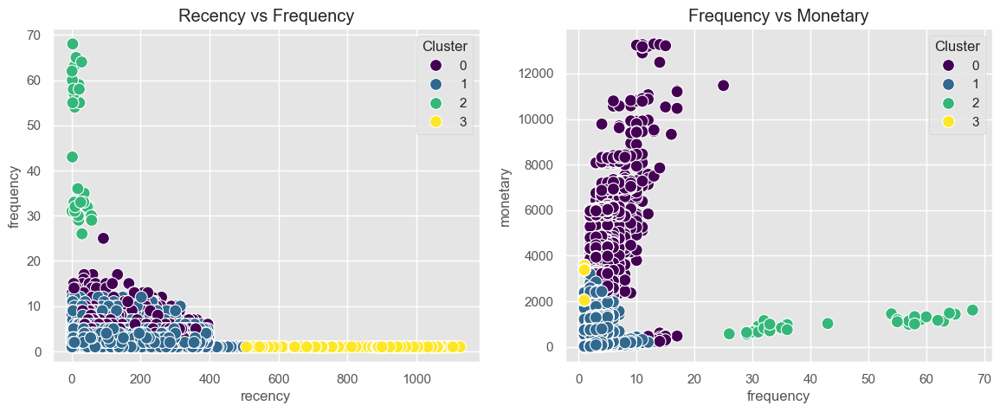

In [113]:
#Create a 2D scatter plot for each pair of RFM scores
plt.figure(figsize=(14, 5))

# Recency vs Frequency
plt.subplot(1, 2, 1)
sns.scatterplot(data=rfm, x='recency', y='frequency', hue='Cluster', palette='viridis', s=100)
plt.title('Recency vs Frequency')

# Frequency vs Monetary
plt.subplot(1, 2, 2)
sns.scatterplot(data=rfm, x='frequency', y='monetary', hue='Cluster', palette='viridis', s=100)
plt.title('Frequency vs Monetary')

plt.show()

In [114]:
# Let's do a 3D view for k=4 as well

In [115]:
# Select the CustomerKey (index) and other columns
new_rfm = rfm[['recency', 'frequency', 'monetary']].copy()
new_rfm['CustomerKey'] = new_rfm.index

# Reset the index to make CustomerKey a column again
new_rfm = new_rfm.reset_index(drop=True)

# Rearrange columns to have CustomerID first
new_rfm = new_rfm[['CustomerKey', 'recency', 'frequency', 'monetary']]


# Add the cluster labels to the original DataFrame
new_rfm['Cluster'] = labels


new_rfm.head()

,CustomerKey,recency,frequency,monetary,Cluster
0,11000,271,8,8248.99,0
1,11001,50,11,6383.88,0
2,11002,340,4,8114.04,0
3,11003,264,9,8139.29,0
4,11004,273,6,8196.01,0


In [116]:
new_rfm['Cluster'].value_counts()

Cluster
1    13870
0     4167
3      412
2       35
Name: count, dtype: int64

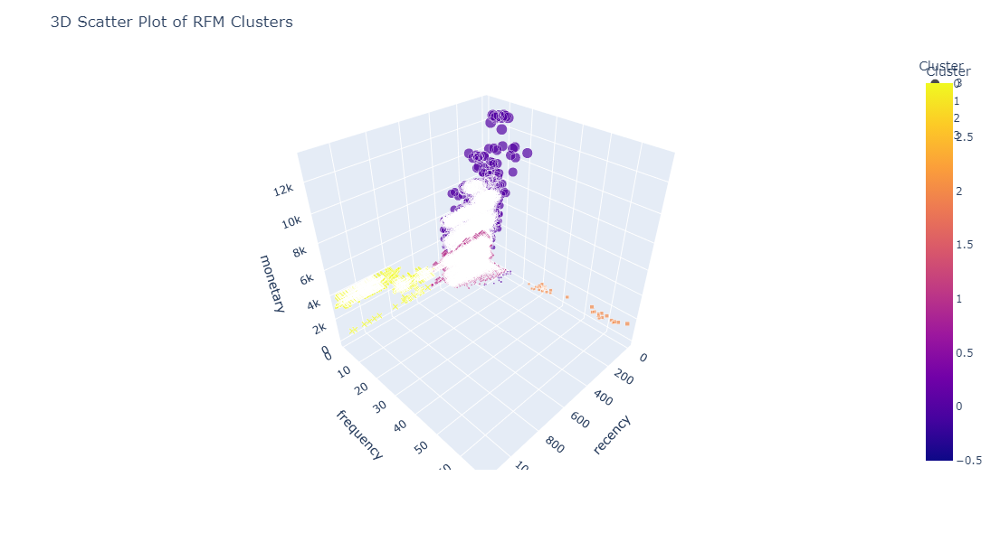

In [117]:
# Create a 3D scatter plot using Plotly for a better view
fig = px.scatter_3d(new_rfm, x='recency', y='frequency', z='monetary', color='Cluster', symbol='Cluster', size='monetary', hover_data=['CustomerKey'])
fig.update_layout(title='3D Scatter Plot of RFM Clusters', width=800, height=600)
fig.show()

In [118]:
rfm.head()

,recency,frequency,monetary,r_quartile,f_quartile,m_quartile,RFM_Score,Cluster
CustomerKey,,,,,,,,
11000,271,8,8248.99,4,1,1,411,0
11001,50,11,6383.88,1,1,1,111,0
11002,340,4,8114.04,4,2,1,421,0
11003,264,9,8139.29,3,1,1,311,0
11004,273,6,8196.01,4,1,1,411,0


In [119]:
rfm.shape

(18484, 8)

#### EDA with the calulated RFM scores

We need to concatenate our rfm df with the initial df to do this

In [121]:
# Remove duplicates based on CustomerKey columns
df_dup= df.drop_duplicates(subset=['CustomerKey'])

df_dup.shape

(18484, 16)

In [122]:
rfm.shape, df_dup.shape

((18484, 8), (18484, 16))

In [123]:
# Reset indices to ensure alignment
rfm.reset_index(drop=True, inplace=True)
df_dup.reset_index(drop=True, inplace=True)

In [124]:
# Concatenate the rfm to the initial df
df_rfm_eda = pd.concat([df_dup, rfm], axis=1)

df_rfm_eda.head()

,CustomerKey,SalesOrderNumber,YearlyIncome,Age,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,...,OrderQuantity,ChurnFlag,recency,frequency,monetary,r_quartile,f_quartile,m_quartile,RFM_Score,Cluster
0,11000,SO43793,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,...,1,1,271,8,8248.99,4,1,1,411,0
1,11001,SO43767,60000.0,38,S,M,Bachelors,Professional,Mid Income,3-5 kids,...,1,1,50,11,6383.88,1,1,1,111,0
2,11002,SO43736,60000.0,43,M,M,Bachelors,Professional,Mid Income,3-5 kids,...,1,1,340,4,8114.04,4,2,1,421,0
3,11003,SO43701,70000.0,41,S,F,Bachelors,Professional,Mid Income,No kids,...,1,1,264,9,8139.29,3,1,1,311,0
4,11004,SO43810,80000.0,35,S,F,Bachelors,Professional,Mid Income,3-5 kids,...,1,1,273,6,8196.01,4,1,1,411,0


In [125]:
drop_columns = ['OrderQuantity','recency', 'monetary',
               'frequency', 'r_quartile','f_quartile', 'm_quartile', 
                'SalesOrderNumber', 'YearlyIncome', 'Age', 'NumberChildrenAtHome'
                
               
            ]

df_rfm_eda = df_rfm_eda.drop(drop_columns, axis = 1)

df_rfm_eda.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Cluster
0,11000,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,3399.99,2011-01-19,1,411,0
1,11001,S,M,Bachelors,Professional,Mid Income,3-5 kids,31-40,3374.99,2011-01-15,1,111,0
2,11002,M,M,Bachelors,Professional,Mid Income,3-5 kids,41-50,3399.99,2011-01-07,1,421,0
3,11003,S,F,Bachelors,Professional,Mid Income,No kids,41-50,3399.99,2010-12-29,1,311,0
4,11004,S,F,Bachelors,Professional,Mid Income,3-5 kids,31-40,3399.99,2011-01-23,1,411,0


#### EDA on our new dataset

This is to know customers who contribute most to churn rate, or the rate at which a customer stops doing business with AHG.

In [127]:
df_rfm_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18484 entries, 0 to 18483
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   CustomerKey     18484 non-null  int64         
 1   MaritalStatus   18484 non-null  object        
 2   Gender          18484 non-null  object        
 3   Education       18484 non-null  object        
 4   Occupation      18484 non-null  object        
 5   Income Segment  18484 non-null  object        
 6   TotalChildren   18484 non-null  object        
 7   Age Group       18484 non-null  object        
 8   SalesAmount     18484 non-null  float64       
 9   OrderDate       18484 non-null  datetime64[ns]
 10  ChurnFlag       18484 non-null  int64         
 11  RFM_Score       18484 non-null  object        
 12  Cluster         18484 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(2), object(8)
memory usage: 1.8+ MB


In [128]:

# Convert the RFM_Score column to integer
df_rfm_eda['RFM_Score'] = pd.to_numeric(df_rfm_eda['RFM_Score'])

df_rfm_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18484 entries, 0 to 18483
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   CustomerKey     18484 non-null  int64         
 1   MaritalStatus   18484 non-null  object        
 2   Gender          18484 non-null  object        
 3   Education       18484 non-null  object        
 4   Occupation      18484 non-null  object        
 5   Income Segment  18484 non-null  object        
 6   TotalChildren   18484 non-null  object        
 7   Age Group       18484 non-null  object        
 8   SalesAmount     18484 non-null  float64       
 9   OrderDate       18484 non-null  datetime64[ns]
 10  ChurnFlag       18484 non-null  int64         
 11  RFM_Score       18484 non-null  int64         
 12  Cluster         18484 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(3), object(7)
memory usage: 1.8+ MB


In [129]:
# To check if there is any Nan in our rfm column:
df_rfm_eda['RFM_Score'].unique()

array([411, 111, 421, 311, 321, 213, 113, 413, 432, 221, 211, 112, 442,
       313, 121, 412, 131, 231, 234, 223, 331, 124, 323, 123, 441, 144,
       233, 444, 114, 422, 324, 333, 133, 314, 334, 134, 423, 244, 431,
       224, 222, 312, 344, 433, 434, 143, 243, 443, 343, 424, 142, 341,
       212, 214, 232, 342, 241, 332, 322, 141, 122, 132, 242, 414],
      dtype=int64)

### We need to see how each categorical column affect/contribute to churn

##### Age group EDA based on RFM score



In [131]:
# Segment Customers Based on RFM Score
# Segment customers into high, medium, and low risk based on the RFM score.

In [132]:
# Let's define risk segmentation

In [133]:
# Define RFM score thresholds for segmentation
high_risk_threshold = df_rfm_eda['RFM_Score'].quantile(0.33)
low_risk_threshold = df_rfm_eda['RFM_Score'].quantile(0.67)

# Categorize customers into High, Medium, and Low risk based on RFM score
def categorize_risk(rfm_score, high_risk_threshold, low_risk_threshold):
    if rfm_score <= high_risk_threshold:
        return 'High'
    elif rfm_score <= low_risk_threshold:
        return 'Medium'
    else:
        return 'Low'

df_rfm_eda['RiskCategory'] = df_rfm_eda['RFM_Score'].apply(categorize_risk, args=(high_risk_threshold, low_risk_threshold))

In [134]:

# Pivot table to analyze churn rate by category and risk category
pivot_table = df_rfm_eda.pivot_table(index='Age Group', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display the pivot table
print("\nChurn Rate by Age Group and Risk Category:")

print(pivot_table)

df_rfm_eda.head()


Churn Rate by Age Group and Risk Category:
RiskCategory Age Group      High       Low    Medium
0                21-30  0.417127  0.835979  0.447368
1                31-40  0.444184  0.851852  0.413763
2                41-50  0.426843  0.846341  0.402204
3                51-60  0.436750  0.799811  0.371117
4                61-70  0.379599  0.804538  0.330579
5                71-80  0.208333  0.763889  0.283871
6                81-90  0.166667  0.692308  0.333333


,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Cluster,RiskCategory
0,11000,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,3399.99,2011-01-19,1,411,0,Low
1,11001,S,M,Bachelors,Professional,Mid Income,3-5 kids,31-40,3374.99,2011-01-15,1,111,0,High
2,11002,M,M,Bachelors,Professional,Mid Income,3-5 kids,41-50,3399.99,2011-01-07,1,421,0,Low
3,11003,S,F,Bachelors,Professional,Mid Income,No kids,41-50,3399.99,2010-12-29,1,311,0,Medium
4,11004,S,F,Bachelors,Professional,Mid Income,3-5 kids,31-40,3399.99,2011-01-23,1,411,0,Low


In [135]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each category within the high-risk segment
mean_churn_by_category = high_risk_df.groupby('Age Group')['ChurnFlag'].mean().reset_index()

# Rank the categories based on the mean churn rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the categories by rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the ranked categories
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)



Ranked Categories by Mean Churn Rate (High Risk):
  Age Group  ChurnFlag  Rank
1     31-40   0.444184   1.0
3     51-60   0.436750   2.0
2     41-50   0.426843   3.0
0     21-30   0.417127   4.0
4     61-70   0.379599   5.0
5     71-80   0.208333   6.0
6     81-90   0.166667   7.0


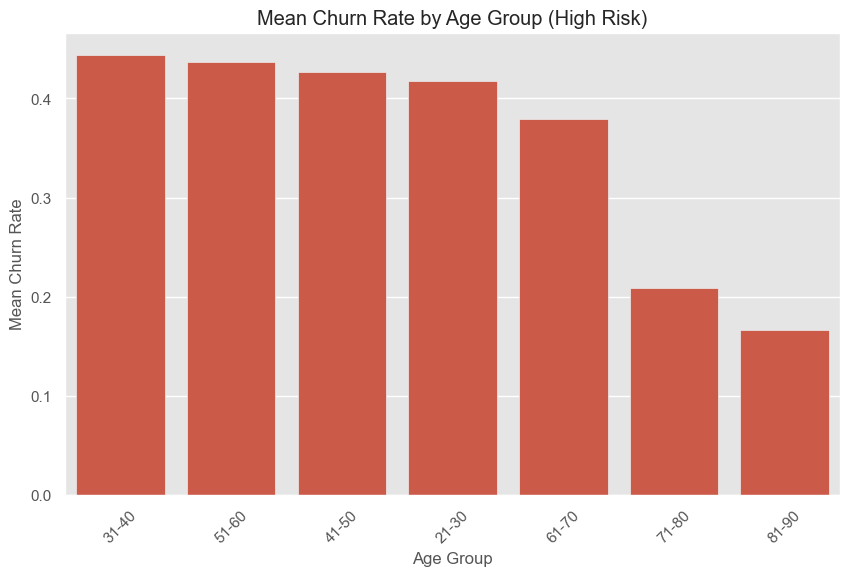

In [136]:

# Create a bar plot for the ranked categories by mean churn rate
plt.figure(figsize=(10, 6))
sns.barplot(x='Age Group', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['Age Group'])

# Add titles and labels
plt.title('Mean Churn Rate by Age Group (High Risk)')
plt.xlabel('Age Group')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()


In [137]:
#Create the 3D Plot
#Using plotly, create a 3D scatter plot to visualize the data.

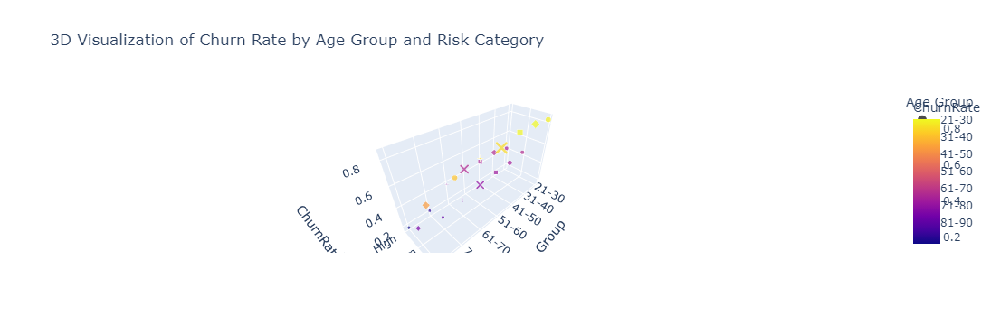

In [138]:


# Melt the pivot table for easy plotting
melted_pivot_table = pivot_table.melt(id_vars='Age Group', value_vars=['High', 'Medium', 'Low'], var_name='RiskCategory', value_name='ChurnRate')

# Create the 3D scatter plot
fig = px.scatter_3d(melted_pivot_table, x='Age Group', y='RiskCategory', z='ChurnRate', 
                    color='ChurnRate', size='ChurnRate', size_max=10, 
                    symbol='Age Group', title='3D Visualization of Churn Rate by Age Group and Risk Category')

# Show the plot
fig.show()


##### Income Segment EDA based on RFM score

In [140]:
#We have already defined our threshold to categorise our risk above

# Pivot table to analyze churn rate by Income Category and risk category
pivot_table = df_rfm_eda.pivot_table(index='Income Segment', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display the pivot table
print("\nChurn Rate by Income Segment and Risk Category:")

print(pivot_table)




Churn Rate by Income Segment and Risk Category:
RiskCategory Income Segment      High       Low    Medium
0               High Income  0.563636  0.800000  0.501748
1                Low Income  0.413214  0.826897  0.333771
2                Mid Income  0.405339  0.845286  0.435906


In [141]:
# Focus on the high risk segment

In [142]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each category within the high-risk segment
mean_churn_by_category = high_risk_df.groupby('Income Segment')['ChurnFlag'].mean().reset_index()

# Rank the categories based on the mean churn rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the categories by rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the ranked categories
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)



Ranked Categories by Mean Churn Rate (High Risk):
  Income Segment  ChurnFlag  Rank
0    High Income   0.563636   1.0
1     Low Income   0.413214   2.0
2     Mid Income   0.405339   3.0


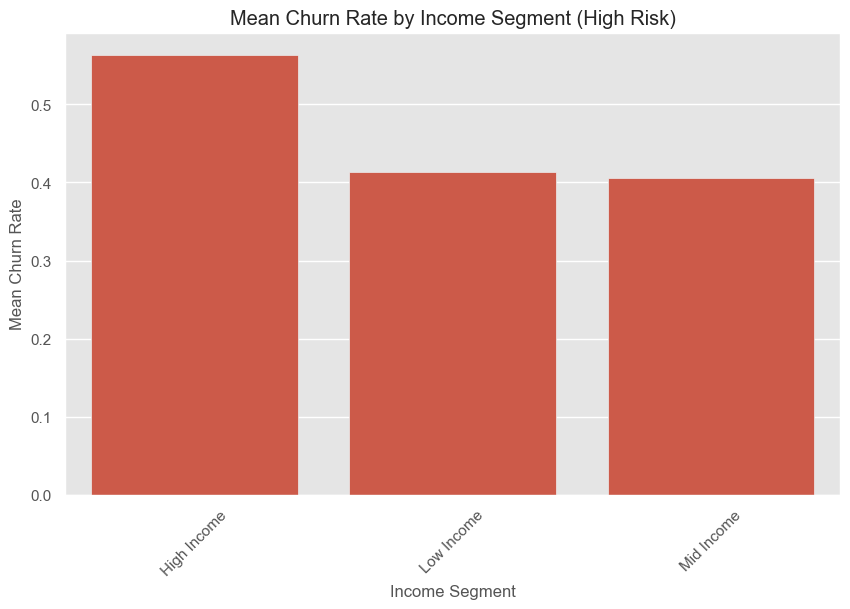

In [143]:
# Uisng visualization to explore this further.

# Create a bar plot for the ranked categories by mean churn rate
plt.figure(figsize=(10, 6))
sns.barplot(x='Income Segment', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['Income Segment'])

# Add titles and labels
plt.title('Mean Churn Rate by Income Segment (High Risk)')
plt.xlabel('Income Segment')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()


##### TotalChildren EDA based on RFM Score

In [145]:
#We have already defined our threshold to categorise our risk above

# Pivot table to analyze churn rate by TotalChildren and risk category
pivot_table = df_rfm_eda.pivot_table(index='TotalChildren', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display the pivot table
print("\nChurn Rate by Income Segment and Risk Category:")

print(pivot_table)




Churn Rate by Income Segment and Risk Category:
RiskCategory TotalChildren      High       Low    Medium
0                 1-2 kids  0.464286  0.832983  0.403868
1                 3-5 kids  0.337221  0.822771  0.351701
2                  No kids  0.467789  0.843691  0.427799


In [146]:
# Focusing on the high risk

In [147]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each category within the high-risk segment
mean_churn_by_category = high_risk_df.groupby('TotalChildren')['ChurnFlag'].mean().reset_index()

# Rank the categories based on the mean churn rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the categories by rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the ranked categories
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)



Ranked Categories by Mean Churn Rate (High Risk):
  TotalChildren  ChurnFlag  Rank
2       No kids   0.467789   1.0
0      1-2 kids   0.464286   2.0
1      3-5 kids   0.337221   3.0


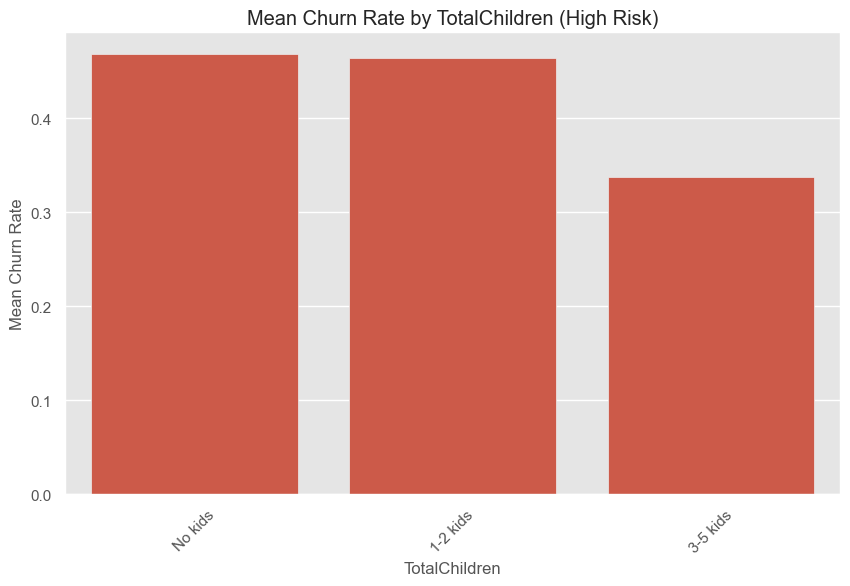

In [148]:
# Uisng visualization to explore this further.

# Create a bar plot for the ranked categories by mean churn rate
plt.figure(figsize=(10, 6))
sns.barplot(x='TotalChildren', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['TotalChildren'])

# Add titles and labels
plt.title('Mean Churn Rate by TotalChildren (High Risk)')
plt.xlabel('TotalChildren')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()


##### Gender EDA based on RFM score

In [150]:
# Pivot table to analyze churn rate by Gender and risk category
pivot_table = df_rfm_eda.pivot_table(index='Gender', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display the pivot table
print("\nChurn Rate by Gender and Risk Category:")

print(pivot_table)



Churn Rate by Gender and Risk Category:
RiskCategory Gender      High       Low    Medium
0                 F  0.435830  0.843365  0.388838
1                 M  0.413226  0.822467  0.399080


In [151]:
# Focusing on the High risk

In [152]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each category within the high-risk segment
mean_churn_by_category = high_risk_df.groupby('Gender')['ChurnFlag'].mean().reset_index()

# Rank the categories based on the mean churn rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the categories by rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the ranked categories
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)



Ranked Categories by Mean Churn Rate (High Risk):
  Gender  ChurnFlag  Rank
0      F   0.435830   1.0
1      M   0.413226   2.0


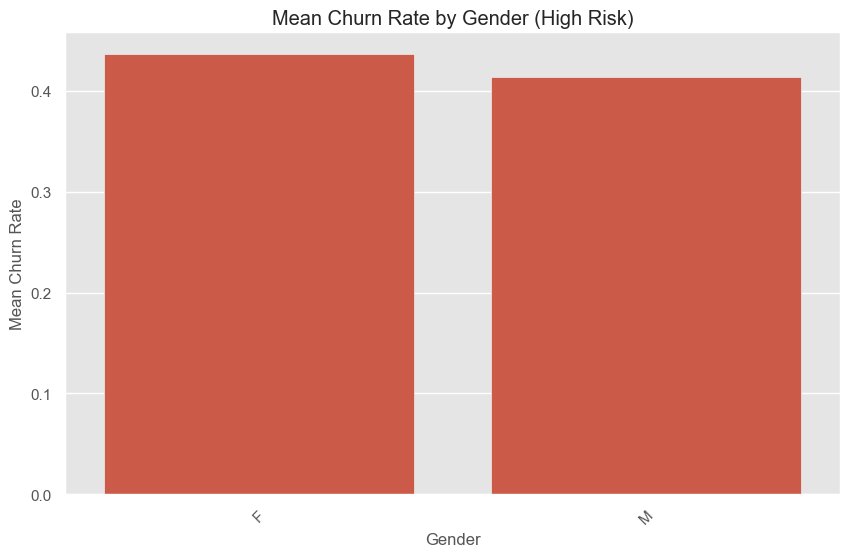

In [153]:
# Uisng visualization to explore this further.

# Create a bar plot for the ranked categories by mean churn rate
plt.figure(figsize=(10, 6))
sns.barplot(x='Gender', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['Gender'])

# Add titles and labels
plt.title('Mean Churn Rate by Gender (High Risk)')
plt.xlabel('Gender')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()


##### MaritalStatus EDA based on RFM Score

In [155]:
# Pivot table to analyze churn rate by MaritalStatus and risk category
pivot_table = df_rfm_eda.pivot_table(index='MaritalStatus', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display the pivot table
print("\nChurn Rate by MaritalStatus and Risk Category:")

print(pivot_table)


Churn Rate by MaritalStatus and Risk Category:
RiskCategory MaritalStatus      High       Low    Medium
0                        M  0.421115  0.817805  0.382520
1                        S  0.428366  0.849889  0.407407


In [156]:
# Focusing only on high risk

In [157]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each category within the high-risk segment
mean_churn_by_category = high_risk_df.groupby('MaritalStatus')['ChurnFlag'].mean().reset_index()

# Rank the categories based on the mean churn rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the categories by rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the ranked categories
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)



Ranked Categories by Mean Churn Rate (High Risk):
  MaritalStatus  ChurnFlag  Rank
1             S   0.428366   1.0
0             M   0.421115   2.0


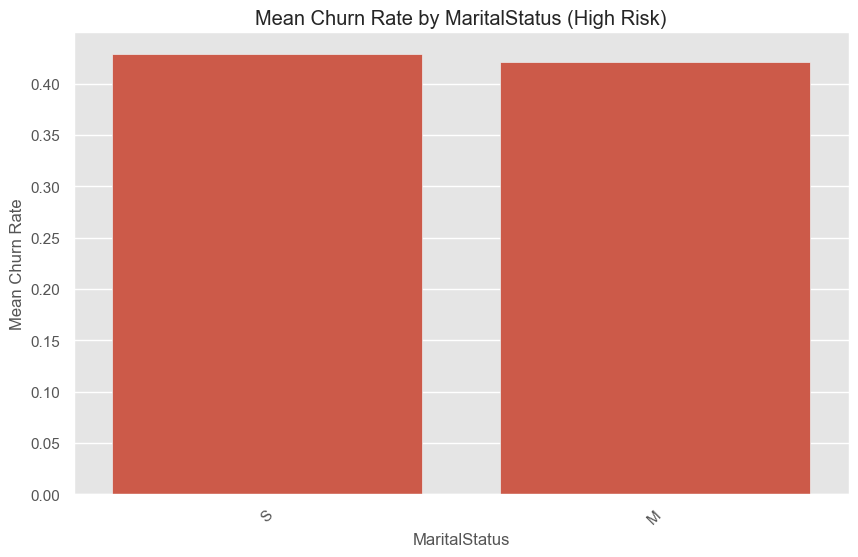

In [158]:
# Uisng visualization to explore this further.

# Create a bar plot for the ranked categories by mean churn rate
plt.figure(figsize=(10, 6))
sns.barplot(x='MaritalStatus', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['MaritalStatus'])

# Add titles and labels
plt.title('Mean Churn Rate by MaritalStatus (High Risk)')
plt.xlabel('MaritalStatus')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()


##### Education EDA by RFM Score

In [160]:
# Pivot table to analyze churn rate by Education and risk category
pivot_table = df_rfm_eda.pivot_table(index='Education', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display the pivot table
print("\nChurn Rate by Education and Risk Category:")

print(pivot_table)


Churn Rate by Education and Risk Category:
RiskCategory            Education      High       Low    Medium
0                       Bachelors  0.471861  0.847565  0.436949
1                 Graduate Degree  0.407011  0.842654  0.418248
2                     High School  0.390379  0.821229  0.347673
3                 Partial College  0.415882  0.836551  0.393370
4             Partial High School  0.385263  0.783451  0.289963


In [161]:
# Focusing only on High risk

In [162]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each category within the high-risk segment
mean_churn_by_category = high_risk_df.groupby('Education')['ChurnFlag'].mean().reset_index()

# Rank the categories based on the mean churn rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the categories by rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the ranked categories
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)


Ranked Categories by Mean Churn Rate (High Risk):
             Education  ChurnFlag  Rank
0            Bachelors   0.471861   1.0
3      Partial College   0.415882   2.0
1      Graduate Degree   0.407011   3.0
2          High School   0.390379   4.0
4  Partial High School   0.385263   5.0


In [163]:
# Visualizing this

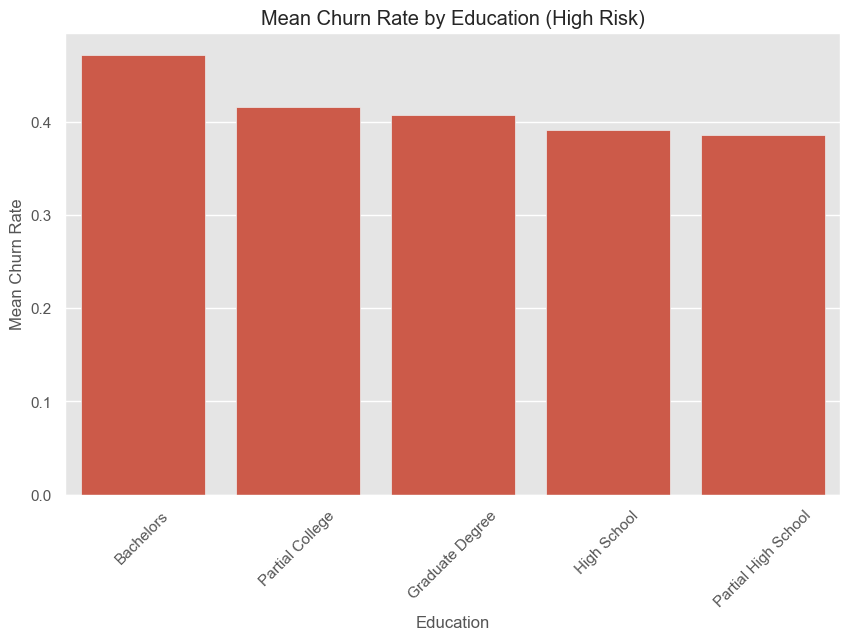

In [164]:
# Uisng visualization to explore this further.

# Create a bar plot for the ranked categories by mean churn rate
plt.figure(figsize=(10, 6))
sns.barplot(x='Education', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['Education'])

# Add titles and labels
plt.title('Mean Churn Rate by Education (High Risk)')
plt.xlabel('Education')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()

##### Occupation EDA based on RFM SCore

In [166]:
# Pivot table to analyze churn rate by Occupation and risk category
pivot_table = df_rfm_eda.pivot_table(index='Occupation', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display the pivot table
print("\nChurn Rate by Occupation and Risk Category:")

print(pivot_table)


Churn Rate by Occupation and Risk Category:
RiskCategory      Occupation      High       Low    Medium
0                   Clerical  0.511270  0.842623  0.365477
1                 Management  0.444123  0.823144  0.449599
2                     Manual  0.368497  0.820413  0.347495
3               Professional  0.421264  0.841780  0.433962
4             Skilled Manual  0.382250  0.829086  0.350683


In [167]:
# Focusing on Highrisk

In [168]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each category within the high-risk segment
mean_churn_by_category = high_risk_df.groupby('Occupation')['ChurnFlag'].mean().reset_index()

# Rank the categories based on the mean churn rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the categories by rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the ranked categories
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)


Ranked Categories by Mean Churn Rate (High Risk):
       Occupation  ChurnFlag  Rank
0        Clerical   0.511270   1.0
1      Management   0.444123   2.0
3    Professional   0.421264   3.0
4  Skilled Manual   0.382250   4.0
2          Manual   0.368497   5.0


In [169]:
# Visualising this

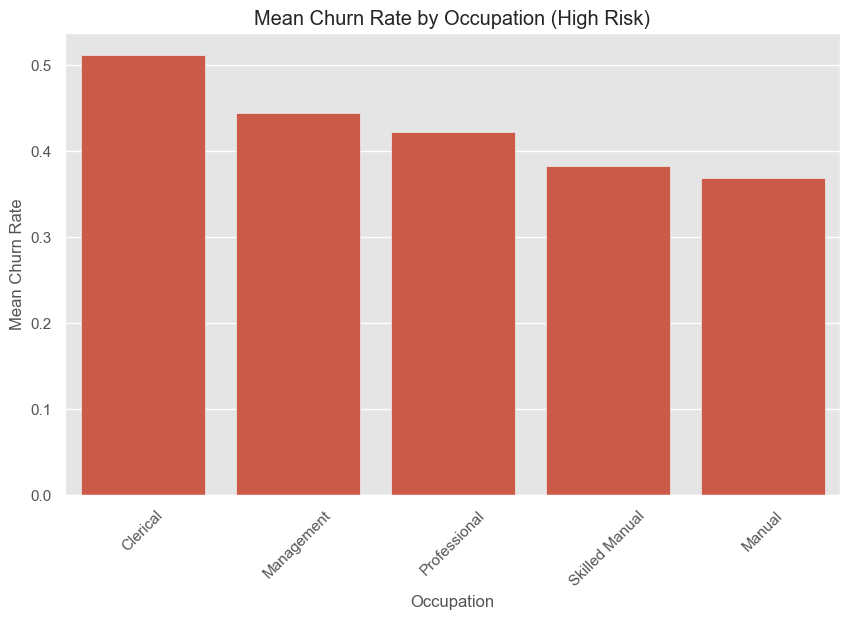

In [170]:
# Uisng visualization to explore this further.

# Create a bar plot for the ranked categories by mean churn rate
plt.figure(figsize=(10, 6))
sns.barplot(x='Occupation', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['Occupation'])

# Add titles and labels
plt.title('Mean Churn Rate by Occupation (High Risk)')
plt.xlabel('Occupation')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()

#### Let's try and combine the age group with some categorical features.

In [172]:
# Age Group and Income Segment

In [173]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age group and Income Segment
mean_churn_by_combination = high_risk_df.groupby(['Age Group', 'Income Segment'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print("\nMean Churn Rate by Age Group and Income Segment (High Risk):")
print(mean_churn_by_combination)



Mean Churn Rate by Age Group and Income Segment (High Risk):
Income Segment  High Income  Low Income  Mid Income
Age Group                                          
21-30              1.000000    0.391635    0.457447
31-40              0.707792    0.397800    0.455468
41-50              0.449495    0.433642    0.417695
51-60              0.601227    0.443526    0.384201
61-70              0.492958    0.478632    0.273038
71-80              0.307692    0.212121    0.170732
81-90              1.000000    0.142857    0.000000


In [174]:
# Creating a Heatmap to Visualize the Results

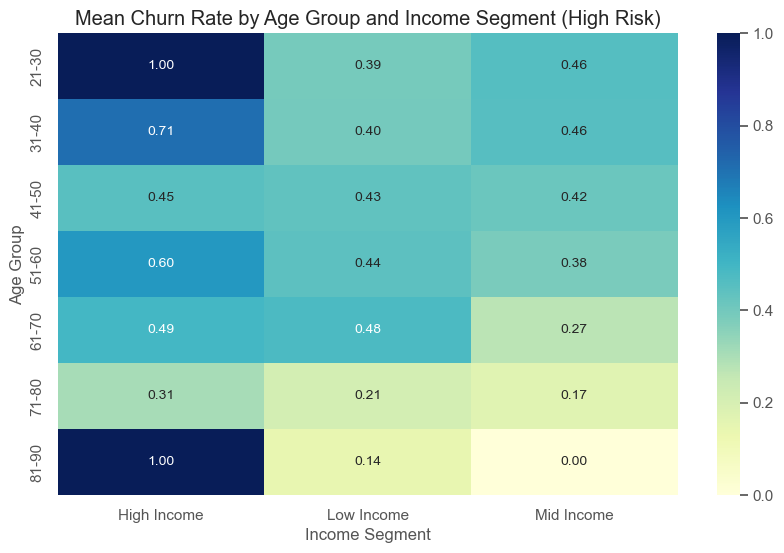

In [175]:


# Create a heatmap for the mean churn rates
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_combination, annot=True, cmap="YlGnBu", fmt=".2f")

# Add titles and labels
plt.title('Mean Churn Rate by Age Group and Income Segment (High Risk)')
plt.xlabel('Income Segment')
plt.ylabel('Age Group')

# Display the plot
plt.show()


In [176]:
# Age Group and Gender

In [177]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age group and Gender
mean_churn_by_combination = high_risk_df.groupby(['Age Group', 'Gender'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print("\nMean Churn Rate by Age Group and Gender (High Risk):")
print(mean_churn_by_combination)



Mean Churn Rate by Age Group and Gender (High Risk):
Gender            F         M
Age Group                    
21-30      0.381503  0.449735
31-40      0.458491  0.430037
41-50      0.457330  0.396018
51-60      0.427746  0.445035
61-70      0.390572  0.368771
71-80      0.189655  0.225806
81-90      0.200000  0.125000


In [178]:
#visualizing this

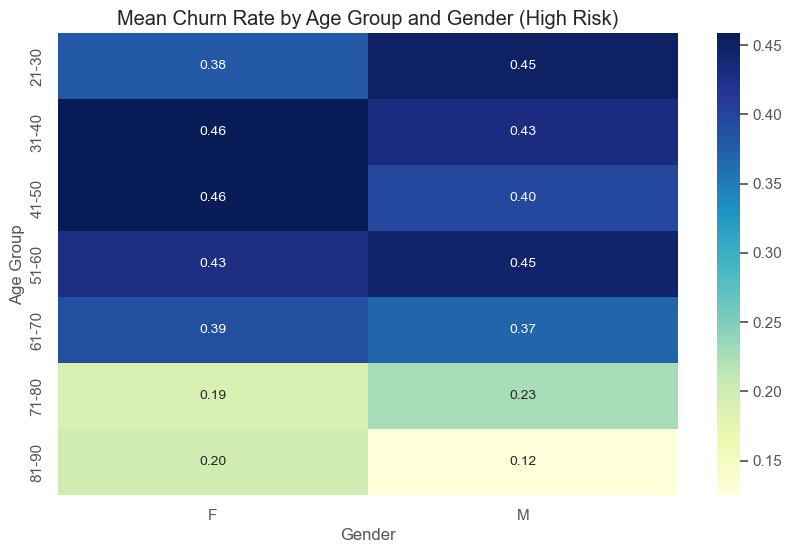

In [179]:
# Create a heatmap for the mean churn rates
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_combination, annot=True, cmap="YlGnBu", fmt=".2f")

# Add titles and labels
plt.title('Mean Churn Rate by Age Group and Gender (High Risk)')
plt.xlabel('Gender')
plt.ylabel('Age Group')

# Display the plot
plt.show()


In [180]:
# Age Group and MaritalStatus

In [181]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age Group and MaritalStatus
mean_churn_by_combination = high_risk_df.groupby(['Age Group', 'MaritalStatus'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print("\nMean Churn Rate by Age Group and MaritalStatus (High Risk):")
print(mean_churn_by_combination)



Mean Churn Rate by Age Group and MaritalStatus (High Risk):
MaritalStatus         M         S
Age Group                        
21-30          0.410959  0.421296
31-40          0.453629  0.435965
41-50          0.424361  0.430000
51-60          0.427350  0.454068
61-70          0.378713  0.381443
71-80          0.197368  0.227273
81-90          0.133333  0.333333


In [182]:
# Visualizing this

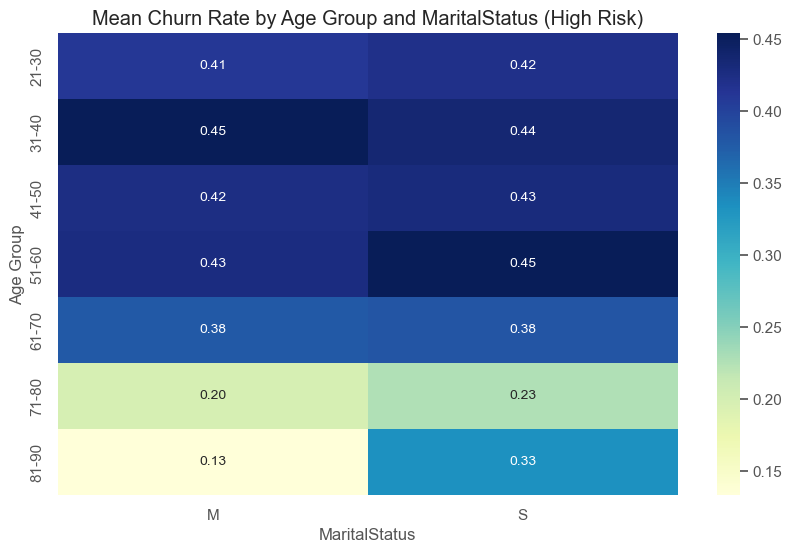

In [183]:
# Create a heatmap for the mean churn rates
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_combination, annot=True, cmap="YlGnBu", fmt=".2f")

# Add titles and labels
plt.title('Mean Churn Rate by Age Group and MaritalStatus (High Risk)')
plt.xlabel('MaritalStatus')
plt.ylabel('Age Group')

# Display the plot
plt.show()


In [184]:
# Age group and Education

In [185]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age Group and Education
mean_churn_by_combination = high_risk_df.groupby(['Age Group', 'Education'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print("\nMean Churn Rate by Age Group and Education (High Risk):")
print(mean_churn_by_combination)



Mean Churn Rate by Age Group and Education (High Risk):
Education  Bachelors  Graduate Degree  High School  Partial College  \
Age Group                                                             
21-30       0.647059         0.555556     0.282609         0.407407   
31-40       0.529052         0.438819     0.434524         0.341004   
41-50       0.451169         0.432258     0.320574         0.439689   
51-60       0.453704         0.465116     0.440828         0.450549   
61-70       0.372180         0.317308     0.322581         0.540816   
71-80       0.250000         0.168831     0.375000         0.263158   
81-90       0.222222         0.000000     0.200000         0.000000   

Education  Partial High School  
Age Group                       
21-30                 0.326531  
31-40                 0.442105  
41-50                 0.362069  
51-60                 0.359712  
61-70                 0.324324  
71-80                      NaN  
81-90                 0.000000  


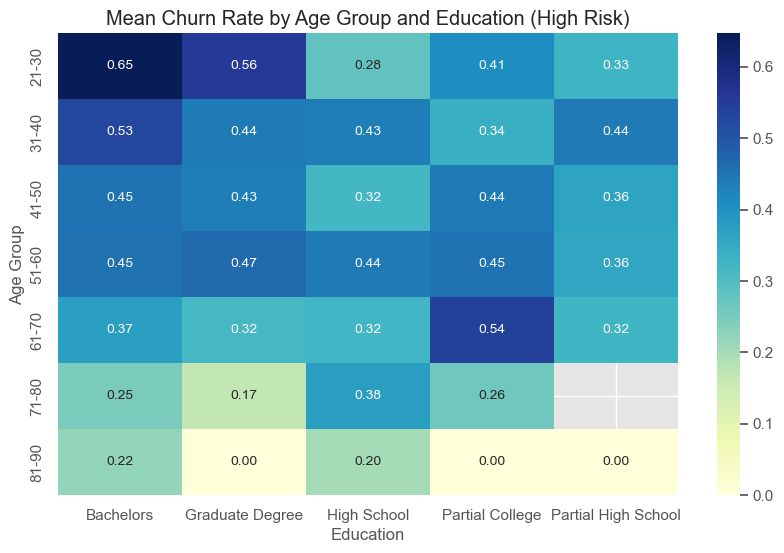

In [186]:
# Create a heatmap for the mean churn rates
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_combination, annot=True, cmap="YlGnBu", fmt=".2f")

# Add titles and labels
plt.title('Mean Churn Rate by Age Group and Education (High Risk)')
plt.xlabel('Education')
plt.ylabel('Age Group')

# Display the plot
plt.show()


In [187]:
# Age Group and Occupation

In [188]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age Group and Occupation
mean_churn_by_combination = high_risk_df.groupby(['Age Group', 'Occupation'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print("\nMean Churn Rate by Age Group and Occupation (High Risk):")
print(mean_churn_by_combination)



Mean Churn Rate by Age Group and Occupation (High Risk):
Occupation  Clerical  Management    Manual  Professional  Skilled Manual
Age Group                                                               
21-30       0.483146    0.722222  0.459770      0.488372        0.272000
31-40       0.494595    0.630522  0.369231      0.494557        0.310092
41-50       0.531120    0.453608  0.352041      0.402797        0.430085
51-60       0.525641    0.445122  0.280702      0.377358        0.532751
61-70       0.647727    0.336232  0.526316      0.270000        0.369565
71-80       0.200000    0.205882  0.000000      0.357143        0.100000
81-90       0.142857         NaN  0.000000      0.500000        0.250000


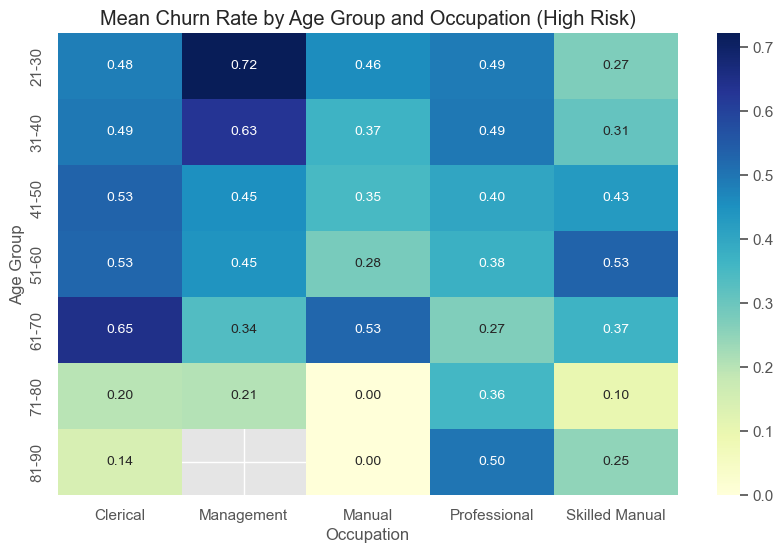

In [189]:
# Create a heatmap for the mean churn rates
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_combination, annot=True, cmap="YlGnBu", fmt=".2f")

# Add titles and labels
plt.title('Mean Churn Rate by Age Group and Occupation (High Risk)')
plt.xlabel('Occupation')
plt.ylabel('Age Group')

# Display the plot
plt.show()

In [190]:
# Age Group and TotalChildren

In [191]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age Group and TotalChildren
mean_churn_by_combination = high_risk_df.groupby(['Age Group', 'TotalChildren'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print("\nMean Churn Rate by Age Group and TotalChildren (High Risk):")
print(mean_churn_by_combination)


Mean Churn Rate by Age Group and TotalChildren (High Risk):
TotalChildren  1-2 kids  3-5 kids   No kids
Age Group                                  
21-30          0.611111  0.297872  0.412186
31-40          0.468454  0.331492  0.466549
41-50          0.478890  0.323699  0.521886
51-60          0.447761  0.420382  0.555556
61-70          0.509804  0.282799       NaN
71-80          0.200000  0.224490  0.000000
81-90          0.111111  0.125000  1.000000


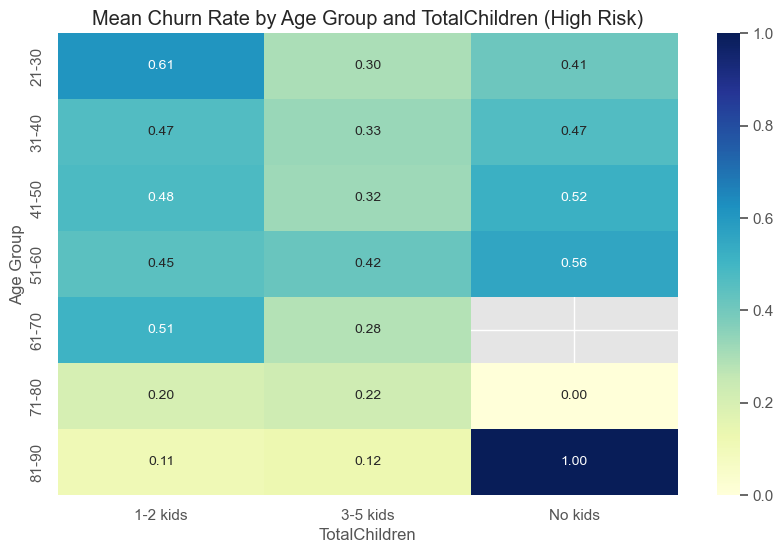

In [192]:
# Create a heatmap for the mean churn rates
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_combination, annot=True, cmap="YlGnBu", fmt=".2f")

# Add titles and labels
plt.title('Mean Churn Rate by Age Group and TotalChildren (High Risk)')
plt.xlabel('TotalChildren')
plt.ylabel('Age Group')

# Display the plot
plt.show()

#### Let's check marital status and totalchildren

In [194]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of MaritalStatus and TotalChildren
mean_churn_by_combination = high_risk_df.groupby(['MaritalStatus', 'TotalChildren'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print("\nMean Churn Rate by MaritalStatus and TotalChildren (High Risk):")
print(mean_churn_by_combination)


Mean Churn Rate by MaritalStatus and TotalChildren (High Risk):
TotalChildren  1-2 kids  3-5 kids   No kids
MaritalStatus                              
M              0.437995  0.336903  0.544141
S              0.507609  0.337731  0.424545


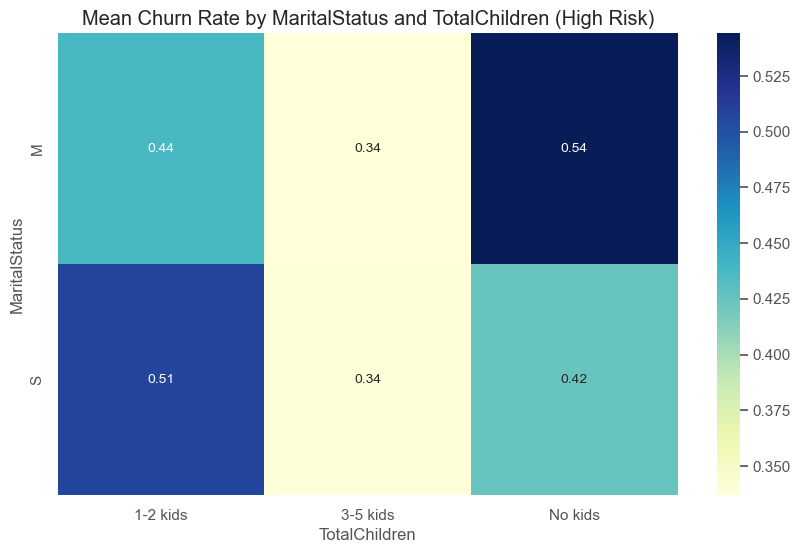

In [195]:
# Create a heatmap for the mean churn rates
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_combination, annot=True, cmap="YlGnBu", fmt=".2f")

# Add titles and labels
plt.title('Mean Churn Rate by MaritalStatus and TotalChildren (High Risk)')
plt.xlabel('TotalChildren')
plt.ylabel('MaritalStatus')

# Display the plot
plt.show()

#### Let's check Gender and totalchildren

In [197]:
# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Gender and TotalChildren
mean_churn_by_combination = high_risk_df.groupby(['Gender', 'TotalChildren'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print("\nMean Churn Rate by Gender and TotalChildren (High Risk):")
print(mean_churn_by_combination)


Mean Churn Rate by Gender and TotalChildren (High Risk):
TotalChildren  1-2 kids  3-5 kids   No kids
Gender                                     
F              0.490377  0.333002  0.481928
M              0.439162  0.341615  0.454647


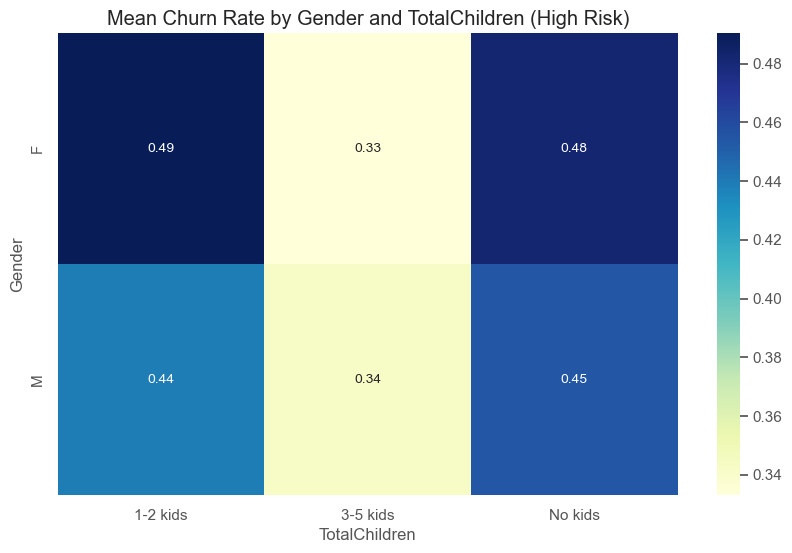

In [198]:
# Create a heatmap for the mean churn rates
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_combination, annot=True, cmap="YlGnBu", fmt=".2f")

# Add titles and labels
plt.title('Mean Churn Rate by Gender and TotalChildren (High Risk)')
plt.xlabel('TotalChildren')
plt.ylabel('Gender')

# Display the plot
plt.show()

# Supervised Machine Learning



In [200]:
df_rfm_eda.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Cluster,RiskCategory
0,11000,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,3399.99,2011-01-19,1,411,0,Low
1,11001,S,M,Bachelors,Professional,Mid Income,3-5 kids,31-40,3374.99,2011-01-15,1,111,0,High
2,11002,M,M,Bachelors,Professional,Mid Income,3-5 kids,41-50,3399.99,2011-01-07,1,421,0,Low
3,11003,S,F,Bachelors,Professional,Mid Income,No kids,41-50,3399.99,2010-12-29,1,311,0,Medium
4,11004,S,F,Bachelors,Professional,Mid Income,3-5 kids,31-40,3399.99,2011-01-23,1,411,0,Low


### Encoding

We need to encode all our object datatype

In [203]:
# a) MaritalStatus
df_rfm_eda.MaritalStatus = df_rfm_eda.MaritalStatus.map(lambda maritalStatus: 1 if maritalStatus == "M" else 0)


# b) Gender (rename as "Female")
df_rfm_eda["Female"] = df_rfm_eda.Gender.map(lambda gender: 1 if gender == "F" else 0)
df_rfm_eda.head() # check

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Cluster,RiskCategory,Female
0,11000,1,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,3399.99,2011-01-19,1,411,0,Low,0
1,11001,0,M,Bachelors,Professional,Mid Income,3-5 kids,31-40,3374.99,2011-01-15,1,111,0,High,0
2,11002,1,M,Bachelors,Professional,Mid Income,3-5 kids,41-50,3399.99,2011-01-07,1,421,0,Low,0
3,11003,0,F,Bachelors,Professional,Mid Income,No kids,41-50,3399.99,2010-12-29,1,311,0,Medium,1
4,11004,0,F,Bachelors,Professional,Mid Income,3-5 kids,31-40,3399.99,2011-01-23,1,411,0,Low,1


In the above dataset, we have 4 ordinal and 1 nominal categorical columns that needs to be encoded needed for our model building

In [205]:
# Starting with the nominal

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# c.)
# Apply label encoding
df_rfm_eda['Occupation'] = label_encoder.fit_transform(df_rfm_eda['Occupation'])


In [206]:

# Encoding for the ordinal categorical column using manual mapping

# d.) Education
# Define the mapping for the ordinal categories
education_mapping = {
    'Partial High School': 1,
    'High School': 2,
    'Partial College': 3,
    'Bachelors': 4,
    'Graduate Degree' : 5
}

# Apply the mapping to the 'Education' column
df_rfm_eda['Education'] = df_rfm_eda['Education'].map(education_mapping)

#e.) Income Segment

# Define the mapping for the ordinal categories
Income_Segment_mapping = {
    'Low Income': 1,
    'Mid Income': 2,
    'High Income': 3,
}

# Apply the mapping to the 'Income segment' column
df_rfm_eda['Income Segment'] = df_rfm_eda['Income Segment'].map(Income_Segment_mapping)



#f.) TotalChildren
# Define the mapping for the ordinal categories
Totalchildren_mapping = {
    'No kids': 1,
    '1-2 kids': 2,
    '3-5 kids': 3,
}

# Apply the mapping to the 'TotalChildren' column
df_rfm_eda['TotalChildren'] = df_rfm_eda['TotalChildren'].map(Totalchildren_mapping)



#g.) Age Group
# Define the mapping for the ordinal categories
Age_mapping = {'21-30': 1,
                '31-40': 2,
                '41-50': 3,
                '51-60': 4, 
                '61-70': 5,
                '71-80': 6,
                '81-90': 7
              }
# Apply the mapping to the 'Age Group' column
df_rfm_eda['Age Group'] = df_rfm_eda['Age Group'].map(Age_mapping)

df_rfm_eda.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Cluster,RiskCategory,Female
0,11000,1,M,4,3,2,2,3,3399.99,2011-01-19,1,411,0,Low,0
1,11001,0,M,4,3,2,3,2,3374.99,2011-01-15,1,111,0,High,0
2,11002,1,M,4,3,2,3,3,3399.99,2011-01-07,1,421,0,Low,0
3,11003,0,F,4,3,2,1,3,3399.99,2010-12-29,1,311,0,Medium,1
4,11004,0,F,4,3,2,3,2,3399.99,2011-01-23,1,411,0,Low,1


In [207]:
df_rfm_eda.shape

(18484, 15)

In [208]:
# now drop the Gender, Cluster and the Risk Category column
columns_to_drop = ['Gender', 'RiskCategory', 'Cluster'
                ]

df_SML = df_rfm_eda.drop(columns_to_drop, axis = 1)

df_SML.head()

,CustomerKey,MaritalStatus,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Female
0,11000,1,4,3,2,2,3,3399.99,2011-01-19,1,411,0
1,11001,0,4,3,2,3,2,3374.99,2011-01-15,1,111,0
2,11002,1,4,3,2,3,3,3399.99,2011-01-07,1,421,0
3,11003,0,4,3,2,1,3,3399.99,2010-12-29,1,311,1
4,11004,0,4,3,2,3,2,3399.99,2011-01-23,1,411,1


In [209]:
RANDOM_STATE = 200 # seed to recreate results (samples the same data each time)

In [210]:
# Total number of people that churned

df_SML['ChurnFlag'].sum()

10027

In [211]:
df_SML.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18484 entries, 0 to 18483
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   CustomerKey     18484 non-null  int64         
 1   MaritalStatus   18484 non-null  int64         
 2   Education       18484 non-null  int64         
 3   Occupation      18484 non-null  int32         
 4   Income Segment  18484 non-null  int64         
 5   TotalChildren   18484 non-null  int64         
 6   Age Group       18484 non-null  int64         
 7   SalesAmount     18484 non-null  float64       
 8   OrderDate       18484 non-null  datetime64[ns]
 9   ChurnFlag       18484 non-null  int64         
 10  RFM_Score       18484 non-null  int64         
 11  Female          18484 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(9)
memory usage: 1.6 MB


In [212]:
 print(f'Total customer that churned is {df_SML['ChurnFlag'].sum()} while customer that did not churn is {(len(df_SML))-(df_SML['ChurnFlag'].sum())}')

Total customer that churned is 10027 while customer that did not churn is 8457


In [213]:
 print(f'The rate at which customers churned is {simple_churn_rate}')

The rate at which customers churned is 37.37789631605268


In [214]:
missingValFinder(df_SML)

['CustomerKey has no missing records',
 'MaritalStatus has no missing records',
 'Education has no missing records',
 'Occupation has no missing records',
 'Income Segment has no missing records',
 'TotalChildren has no missing records',
 'Age Group has no missing records',
 'SalesAmount has no missing records',
 'OrderDate has no missing records',
 'ChurnFlag has no missing records',
 'RFM_Score has no missing records',
 'Female has no missing records']

 We need to split the whole customers to churners and non churners first

In [216]:
# Split the DataFrame into churners and non-churners
churners = df_SML[df_SML['ChurnFlag'] == 1]
non_churners = df_SML[df_SML['ChurnFlag'] == 0]




In [217]:
churners.shape

(10027, 12)

In [218]:
churners.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10027 entries, 0 to 18483
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   CustomerKey     10027 non-null  int64         
 1   MaritalStatus   10027 non-null  int64         
 2   Education       10027 non-null  int64         
 3   Occupation      10027 non-null  int32         
 4   Income Segment  10027 non-null  int64         
 5   TotalChildren   10027 non-null  int64         
 6   Age Group       10027 non-null  int64         
 7   SalesAmount     10027 non-null  float64       
 8   OrderDate       10027 non-null  datetime64[ns]
 9   ChurnFlag       10027 non-null  int64         
 10  RFM_Score       10027 non-null  int64         
 11  Female          10027 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(9)
memory usage: 979.2 KB


In [219]:
non_churners.shape

(8457, 12)

In [220]:
non_churners.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8457 entries, 24 to 18480
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   CustomerKey     8457 non-null   int64         
 1   MaritalStatus   8457 non-null   int64         
 2   Education       8457 non-null   int64         
 3   Occupation      8457 non-null   int32         
 4   Income Segment  8457 non-null   int64         
 5   TotalChildren   8457 non-null   int64         
 6   Age Group       8457 non-null   int64         
 7   SalesAmount     8457 non-null   float64       
 8   OrderDate       8457 non-null   datetime64[ns]
 9   ChurnFlag       8457 non-null   int64         
 10  RFM_Score       8457 non-null   int64         
 11  Female          8457 non-null   int64         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(9)
memory usage: 825.9 KB


We now need to split the non_churners dataset to 60-40, 40% would be used to build our predictive model while the 60 % would be used for our scoring and deployment in place of our live dataset.

In [222]:
# Split the non_churners DataFrame into 60% and 40%
non_churners_60, non_churners_40 = train_test_split(non_churners, test_size=0.4, random_state=RANDOM_STATE)



In [223]:
non_churners_60.shape

(5074, 12)

In [224]:
non_churners_60.head()

,CustomerKey,MaritalStatus,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Female
6671,17671,1,2,4,1,2,4,539.99,2013-06-13,0,332,1
12462,23462,1,4,1,2,3,2,539.99,2013-10-18,0,222,0
4336,15336,1,3,3,2,2,4,4.99,2014-01-20,0,144,0
2858,13858,1,5,4,2,2,2,9.99,2013-08-10,0,323,1
13869,24869,1,2,3,3,3,4,4.99,2013-09-23,0,244,0


In [225]:
non_churners_40.shape

(3383, 12)

We will keep the 60% for scoring while we add the 40% of the non_churners to our initial churners dataset to form our historical dataset which would be used to build our model

In [227]:
churners.shape, non_churners_40.shape

((10027, 12), (3383, 12))

In [228]:
# Reset indices to ensure alignment
churners.reset_index(drop=True, inplace=True)
non_churners_40.reset_index(drop=True, inplace=True)




# Concatenate churners and non_churners_40 DataFrames
df_hist = pd.concat([churners, non_churners_40])

df_hist.head()


,CustomerKey,MaritalStatus,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Female
0,11000,1,4,3,2,2,3,3399.99,2011-01-19,1,411,0
1,11001,0,4,3,2,3,2,3374.99,2011-01-15,1,111,0
2,11002,1,4,3,2,3,3,3399.99,2011-01-07,1,421,0
3,11003,0,4,3,2,1,3,3399.99,2010-12-29,1,311,1
4,11004,0,4,3,2,3,2,3399.99,2011-01-23,1,411,1


In [229]:
df_hist.shape

(13410, 12)

In [230]:
# dropping the customer key and the orderdate as it is not needed in our model building
ck_od = ['CustomerKey', 'OrderDate']

df_hist = df_hist.drop(ck_od, axis=1)

df_hist.columns

Index(['MaritalStatus', 'Education', 'Occupation', 'Income Segment',
       'TotalChildren', 'Age Group', 'SalesAmount', 'ChurnFlag', 'RFM_Score',
       'Female'],
      dtype='object')

### Model Building

#### Feature Engineering

In [233]:
# df_hist would be used to build our model


In [234]:
df_hist['ChurnFlag'].value_counts()

ChurnFlag
1    10027
0     3383
Name: count, dtype: int64

In [235]:
df_hist.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13410 entries, 0 to 3382
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   MaritalStatus   13410 non-null  int64  
 1   Education       13410 non-null  int64  
 2   Occupation      13410 non-null  int32  
 3   Income Segment  13410 non-null  int64  
 4   TotalChildren   13410 non-null  int64  
 5   Age Group       13410 non-null  int64  
 6   SalesAmount     13410 non-null  float64
 7   ChurnFlag       13410 non-null  int64  
 8   RFM_Score       13410 non-null  int64  
 9   Female          13410 non-null  int64  
dtypes: float64(1), int32(1), int64(8)
memory usage: 1.1 MB


In [236]:

# # Convert the RFM_Score column to integer
# df_hist['RFM_Score'] = pd.to_numeric(df_hist['RFM_Score'])

# df_hist.info()

In [237]:
missingValFinder(df_hist)

['MaritalStatus has no missing records',
 'Education has no missing records',
 'Occupation has no missing records',
 'Income Segment has no missing records',
 'TotalChildren has no missing records',
 'Age Group has no missing records',
 'SalesAmount has no missing records',
 'ChurnFlag has no missing records',
 'RFM_Score has no missing records',
 'Female has no missing records']

In [238]:
df_hist.corr()

,MaritalStatus,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,ChurnFlag,RFM_Score,Female
MaritalStatus,1.000000,0.101840,0.035146,0.090758,0.184540,0.175160,-0.056231,-0.011859,-0.012580,-0.034592
Education,0.101840,1.000000,-0.071549,0.223033,0.062641,0.007934,0.098679,0.042000,-0.011128,0.009999
Occupation,0.035146,-0.071549,1.000000,0.143776,-0.035921,-0.146455,-0.004610,-0.009662,0.027491,0.014870
Income Segment,0.090758,0.223033,0.143776,1.000000,0.192765,0.160838,0.076592,0.038431,-0.054241,0.013121
TotalChildren,0.184540,0.062641,-0.035921,0.192765,1.000000,0.478586,-0.074822,-0.049296,0.007394,0.016857
Age Group,0.175160,0.007934,-0.146455,0.160838,0.478586,1.000000,-0.086780,-0.046052,0.001409,0.000064
SalesAmount,-0.056231,0.098679,-0.004610,0.076592,-0.074822,-0.086780,1.000000,0.352215,-0.040410,0.017030
ChurnFlag,-0.011859,0.042000,-0.009662,0.038431,-0.049296,-0.046052,0.352215,1.000000,0.361256,0.011269
RFM_Score,-0.012580,-0.011128,0.027491,-0.054241,0.007394,0.001409,-0.040410,0.361256,1.000000,-0.002864
Female,-0.034592,0.009999,0.014870,0.013121,0.016857,0.000064,0.017030,0.011269,-0.002864,1.000000


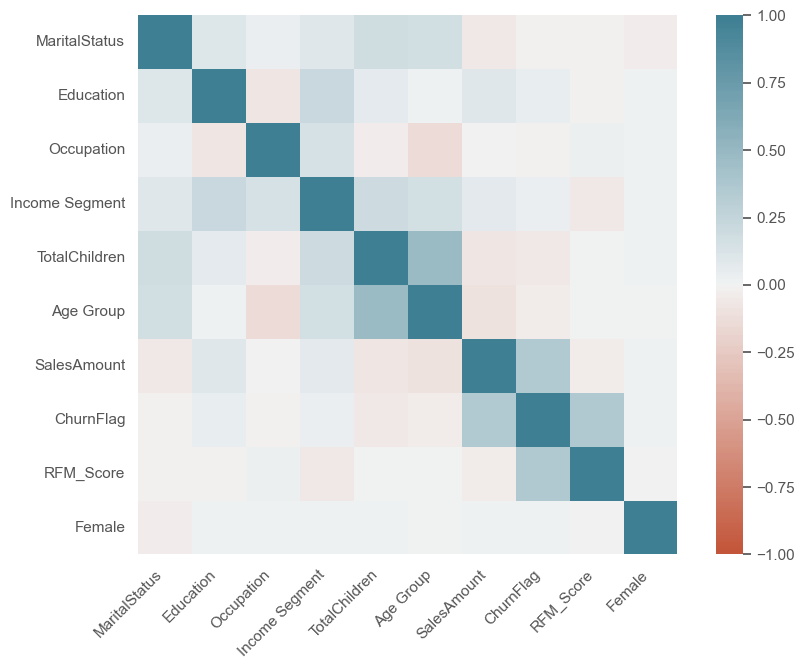

In [239]:
# feature correlation

corr = df_hist.select_dtypes(include=np.number).corr() # correlation values in our imported data

# produce a heatmap of the correlation values
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)

# adding labelling to our chart
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [240]:
# From the correlation figure above RFM_Score and Sales amount both have a positive correlation with Churn

In [241]:
# a) define X as the features
# b) define y as the target
X = df_hist.loc[:, df_hist.columns != "ChurnFlag"]
y = df_hist["ChurnFlag"]

In [242]:
X.shape

(13410, 9)

In [243]:

y.shape

(13410,)

In [244]:
X.columns

Index(['MaritalStatus', 'Education', 'Occupation', 'Income Segment',
       'TotalChildren', 'Age Group', 'SalesAmount', 'RFM_Score', 'Female'],
      dtype='object')

#### Using Recursive Feature Elimination (RFE), we want to select the best features to build our model

In [246]:
#  Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=RANDOM_STATE)


#  Create a logistic regression model
model = LogisticRegression()

#  Apply RFE
rfe = RFE(model, n_features_to_select=2)
fit = rfe.fit(X_train, y_train)

#  Get the rankings of features
print("Num Features: %s" % (fit.n_features_))
print("Selected Features: %s" % (fit.support_))
print("Feature Ranking: %s" % (fit.ranking_))

#  Select the top features
selected_features = X_train.columns[fit.support_]
print("Selected Features:", selected_features)



C:\Users\emmas\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\emmas\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Num Features: 2
Selected Features: [False False False  True  True False False False False]
Feature Ranking: [2 3 5 1 1 4 8 7 6]
Selected Features: Index(['Income Segment', 'TotalChildren'], dtype='object')


In [247]:
# Let's visualize the importance of the features.

In [248]:
# Get the ranking of the features
ranking = fit.ranking_

feature_names = X_train.columns

# Create a DataFrame with feature names and their rankings
feature_ranking = pd.DataFrame({'Feature': feature_names, 'Ranking': ranking})

# Sort the DataFrame by ranking
feature_ranking = feature_ranking.sort_values(by='Ranking')
print(feature_ranking)

          Feature  Ranking
3  Income Segment        1
4   TotalChildren        1
0   MaritalStatus        2
1       Education        3
5       Age Group        4
2      Occupation        5
8          Female        6
7       RFM_Score        7
6     SalesAmount        8


In [249]:
X_train

,MaritalStatus,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,RFM_Score,Female
6351,0,5,0,1,2,3,29.9900,434,0
6271,0,4,3,2,1,2,2181.5625,211,0
5424,1,1,0,1,2,4,4.9900,444,0
1281,0,1,2,1,1,2,2049.0982,221,1
7330,0,2,2,1,1,2,3.9900,444,1
...,...,...,...,...,...,...,...,...,...
9036,0,3,4,2,1,2,2071.4196,442,0
1023,1,4,4,1,2,2,4.9900,344,0
784,1,2,4,1,1,1,3578.2700,311,0
2878,1,1,2,1,1,2,28.9900,334,0


In [250]:
# Now, we'll create a bar plot to visualize the feature importance based on their ranking.

C:\Users\emmas\AppData\Local\Temp\ipykernel_47120\742761963.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




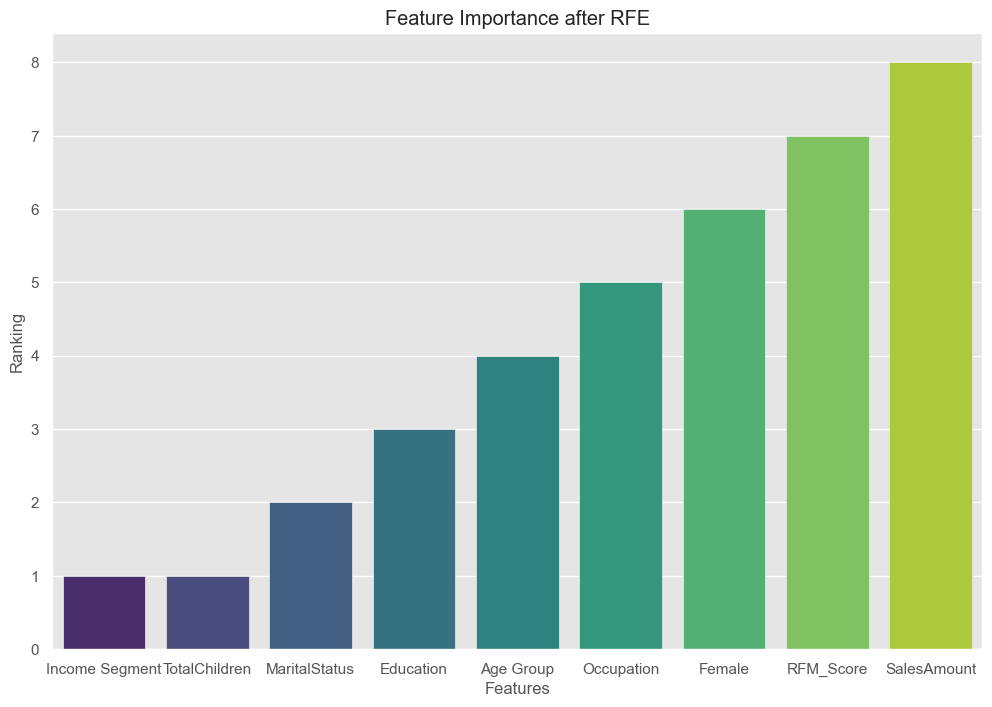

In [251]:


# Plot the data
plt.figure(figsize=(12, 8))
sns.barplot(x='Feature', y='Ranking', data=feature_ranking, palette='viridis')

# Add titles and labels
plt.title('Feature Importance after RFE')
plt.xlabel('Features')
plt.ylabel('Ranking')

# Show the plot
plt.show()


In [252]:
# viewing this in 3D

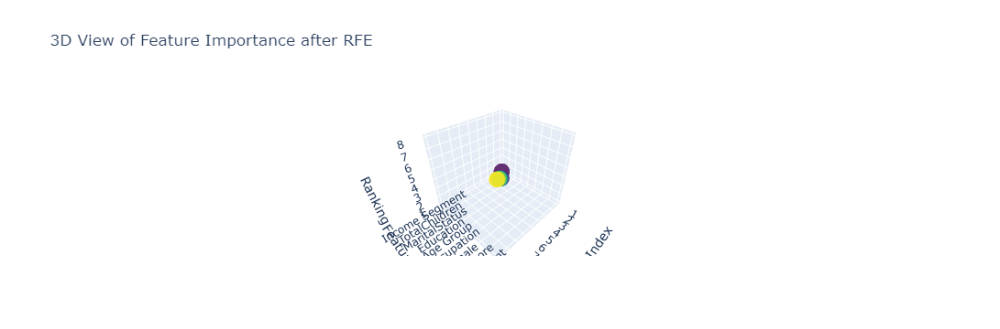

In [253]:
# Add an index column to use as the third dimension
feature_ranking['Index'] = range(1, len(feature_ranking) + 1)

# Create a 3D scatter plot with bars
fig = go.Figure()

# Add bars for each feature
fig.add_trace(go.Scatter3d(
    x=feature_ranking['Index'],
    y=feature_ranking['Feature'],
    z=feature_ranking['Ranking'],
    text=feature_ranking['Feature'],
    mode='markers',
    marker=dict(
        size=10,
        color=feature_ranking['Ranking'],
        colorscale='Viridis',
        opacity=0.8
    )
))

# Add layout details
fig.update_layout(
    title='3D View of Feature Importance after RFE',
    scene=dict(
        xaxis_title='Feature Index',
        yaxis_title='Feature Names',
        zaxis_title='Ranking'
    )
)

# Show the plot
fig.show()

In [254]:
X.columns

Index(['MaritalStatus', 'Education', 'Occupation', 'Income Segment',
       'TotalChildren', 'Age Group', 'SalesAmount', 'RFM_Score', 'Female'],
      dtype='object')

In [255]:
#  Train model with selected features
model.fit(X_train[selected_features], y_train)
score = model.score(X_test[selected_features], y_test)
print("Model accuracy with selected features:", score)

Model accuracy with selected features: 0.7626149639572458


In [256]:
# post-checks for dimensions of the training and test sets
X_test.shape

(4023, 9)

In [257]:
# aside
X_test.columns

Index(['MaritalStatus', 'Education', 'Occupation', 'Income Segment',
       'TotalChildren', 'Age Group', 'SalesAmount', 'RFM_Score', 'Female'],
      dtype='object')

##### Run 0 (Baseline)

In [259]:
# fit an ML algorithm to ALL the features

# Based on the nature of the target value, we use a logistic regression

# STEP 1 set up the model
# NB we need a random seed again here for the random start point for the algo
estimator = LogisticRegression(random_state = RANDOM_STATE)

# STEP 2 fit the model on the TRAINING set
estimator.fit(X_train, y_train)

# STEP 3: predict using the TEST set
y_pred = estimator.predict(X_test)

# STEP 4 (optional) extract the classification PROBABILITIES 
# in order to construct a ROC curve (later)
y_score = estimator.predict_proba(X_test)[:,0]

C:\Users\emmas\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



#### Performance Metrics
we need to look at performance from a number of different perspectives
NB: performance is measured on the TEST set

In [261]:
accuracy_score(y_test, y_pred)

0.8145662440964454

In [262]:
recall_score(y_test, y_pred)

0.9064537157757496

In [263]:
precision_score(y_test, y_pred)

0.8583333333333333

all the above measures are between 0 and 1.

1 is a perfect model, 0 is terrible

In [265]:
 # classification report (use the imported module)
print(classification_report(y_test, y_pred, target_names=["non_churners", "churners"]))

              precision    recall  f1-score   support

non_churners       0.63      0.52      0.57       955
    churners       0.86      0.91      0.88      3068

    accuracy                           0.81      4023
   macro avg       0.75      0.71      0.73      4023
weighted avg       0.80      0.81      0.81      4023



In [266]:
# lets take a look at our confusion matrix...
confusion_matrix(y_test, y_pred)

array([[ 496,  459],
       [ 287, 2781]], dtype=int64)

##### Run 1

let's run by scaling our data set

In [268]:
X.columns

Index(['MaritalStatus', 'Education', 'Occupation', 'Income Segment',
       'TotalChildren', 'Age Group', 'SalesAmount', 'RFM_Score', 'Female'],
      dtype='object')

In [269]:
# we now try scaling the data and applying the above grid search to see if this results
# in a better performance


scaler = StandardScaler() # scaling function

#same three lines below for grid search acroos hyperparameters C and penalty 
param_grid = dict(C=[0.00001,0.0001,0.001,0.01,0.1,1,10],penalty=['l1','l2'])
regr = LogisticRegression(random_state=RANDOM_STATE, solver='liblinear') # 1
cv = GridSearchCV(estimator=regr, param_grid=param_grid, scoring='average_precision') 

pipeline = make_pipeline(scaler, cv) # here we SCALE the data so that all features are in the same "ballpark"

pipeline.fit(X_train, y_train) # 2 fit the model to the SCALED data

y_true = y_test # 3 variable name change (not necessary)
y_pred = pipeline.predict(X_test) # 4
y_score = pipeline.predict_proba(X_test)[:, 1] # 5

In [270]:
 # classification report (use the imported module)
print(classification_report(y_test, y_pred, target_names=["non_churners", "churners"]))

              precision    recall  f1-score   support

non_churners       0.64      0.52      0.57       955
    churners       0.86      0.91      0.88      3068

    accuracy                           0.82      4023
   macro avg       0.75      0.71      0.73      4023
weighted avg       0.81      0.82      0.81      4023



In [271]:
# lets take a look at our confusion matrix...
confusion_matrix(y_test, y_pred)

array([[ 495,  460],
       [ 282, 2786]], dtype=int64)

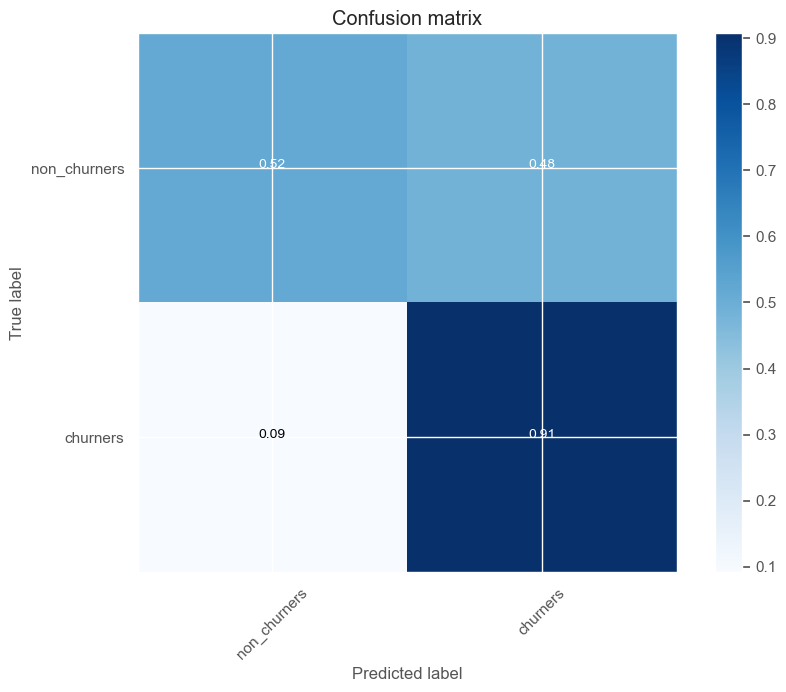

In [272]:
# put the confusion matrix into a nice plot
plot_confusion_matrix(confusion_matrix(y_test, y_pred), 
                      ["non_churners", "churners"])

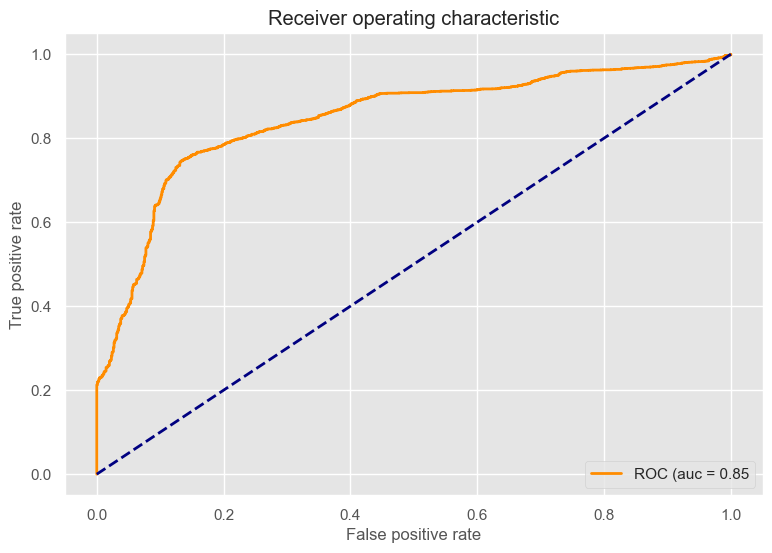

In [273]:
# ROC curve (using the inbuilt function)
plot_roc_curve(y_test, y_score)

In [274]:
df_hist['ChurnFlag'].value_counts()

ChurnFlag
1    10027
0     3383
Name: count, dtype: int64

Our historical data has a highly imbalanced target label, it has more churners than non churners which is making our model to be biased towards the churners despite having a very good accuracy. 

Our model was also built using all the features, we will now go ahead to build our model based on features selected by RFE to be elimitated after resambling

### Resampling:
##### The target is HIGHLY imbalanced - we may need some more sophistcated techniques (e.g. under-sampling of minority class) undersampling the minority class (churners): Our historical dataset has more churners than non churners which would make our model bias towards churners. Typically, in a churn dataset, it is common to have far fewer churners than non-churners, so it makes sense to over-sample the minority class so as to have a good model.

In [277]:
# undersampling the minority class (churners) 


minority_class = df_hist[df_hist.ChurnFlag == 1]
majority_class = df_hist[df_hist.ChurnFlag == 0]

minority_upsampled = resample(minority_class, 
                              replace=True, # sample with replacement
                              n_samples=len(majority_class), # to match majority class
                              random_state=200) # reproducible results

df_upsampled = pd.concat([majority_class, minority_upsampled])

print(df_upsampled['ChurnFlag'].value_counts())


ChurnFlag
0    3383
1    3383
Name: count, dtype: int64


##### Now let's build our model with the balanced target

In [279]:
df_upsampled.columns

Index(['MaritalStatus', 'Education', 'Occupation', 'Income Segment',
       'TotalChildren', 'Age Group', 'SalesAmount', 'ChurnFlag', 'RFM_Score',
       'Female'],
      dtype='object')

#### From our Recursive Feature Elimination (RFE) done earlier which gave the result below

Feature Ranking: [2 3 5 1 1 4 8 7 6]
Selected Features: Index(['Income Segment', 'TotalChildren']

Would be removing the selected features

In [281]:

Selected_Features = ['Income Segment', 'TotalChildren']


df_upsampled = df_upsampled.drop(Selected_Features, axis=1)

df_upsampled.head()

,MaritalStatus,Education,Occupation,Age Group,SalesAmount,ChurnFlag,RFM_Score,Female
0,0,4,3,2,35.00,0,233,1
1,1,4,1,5,4.99,0,244,0
2,0,3,0,1,4.99,0,143,0
3,0,4,0,3,32.60,0,134,0
4,0,4,4,2,1700.99,0,242,0


##### Let's check whether there is any outlier in our dataset

The number of outliers in the data set is : 0


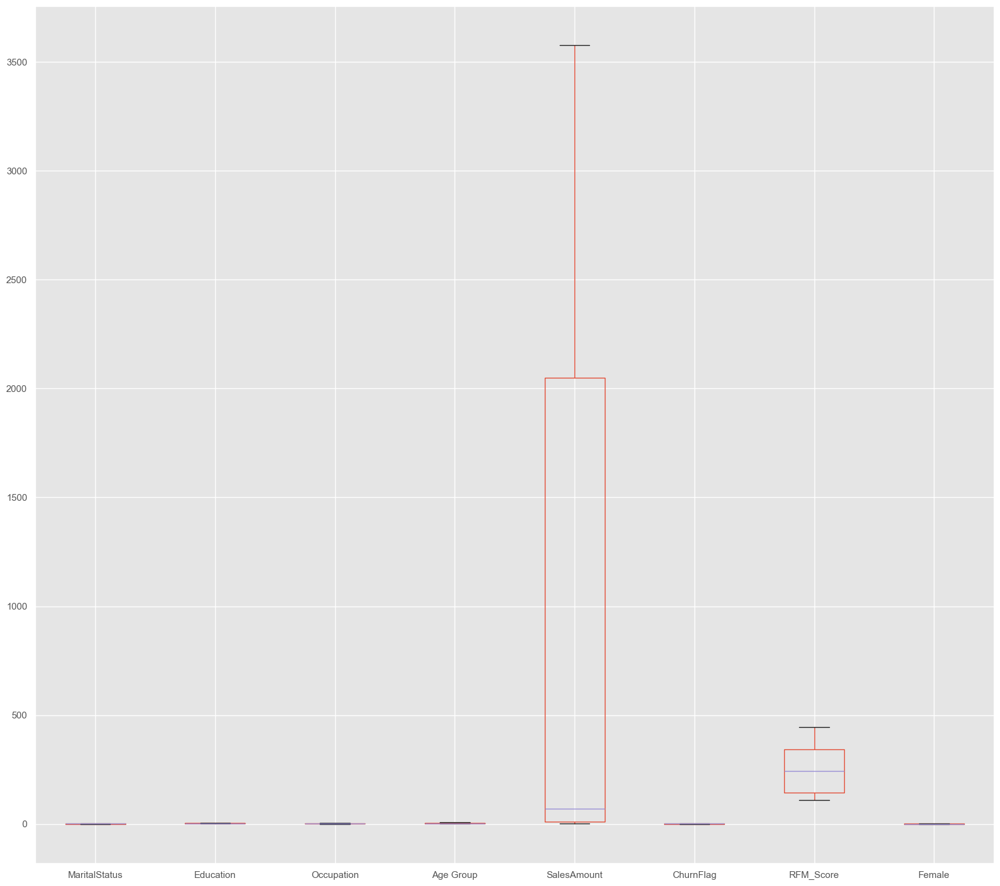

In [283]:
# Plot boxplot
df_upsampled.boxplot(figsize=(20,18))

# Calculate outliers
outliers_count = 0
for column in df_upsampled.select_dtypes(include='number').columns:
    # print(column)
    q1 = df_upsampled[column].quantile(0.25)
    q3 = df_upsampled[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    outliers_count += ((df_upsampled[column] < lower_bound) | (df_upsampled[column] > upper_bound)).sum()

# Print the number of outliers
print(f'The number of outliers in the data set is : {outliers_count}')

# Show the plot
plt.show()


In [284]:
# a) define X as the features
# b) define y as the target
X = df_upsampled.loc[:, df_upsampled.columns != "ChurnFlag"]
y = df_upsampled["ChurnFlag"]

##### We need to scale our data as scaling can lead to improved model performance by ensuring all features contribute equally

In [286]:
# The diff between the min value and max value in our dataset is wide so we need to scale our dataset:


# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the data
scaled_data = scaler.fit_transform(X)

# Create a DataFrame with the scaled data
X_scaled = pd.DataFrame(scaled_data, columns=X.columns)

In [287]:
X_scaled.shape

(6766, 7)

In [288]:
y.shape

(6766,)

Let's run a parallel model selection to know the best model to choose from based on accuracy.

LR, 0.8001750238172235, 0.012758763783444576
LDA, 0.8127384999956299, 0.013866050994816437
KNN, 0.8253028502005891, 0.013842445829802045
CART, 0.9080738202826601, 0.010433541047016315
RF, 0.9299434941833532, 0.008446164551199363
NB, 0.8247126637707254, 0.008725945174637586
SVM, 0.8270779981295832, 0.010081724448169798


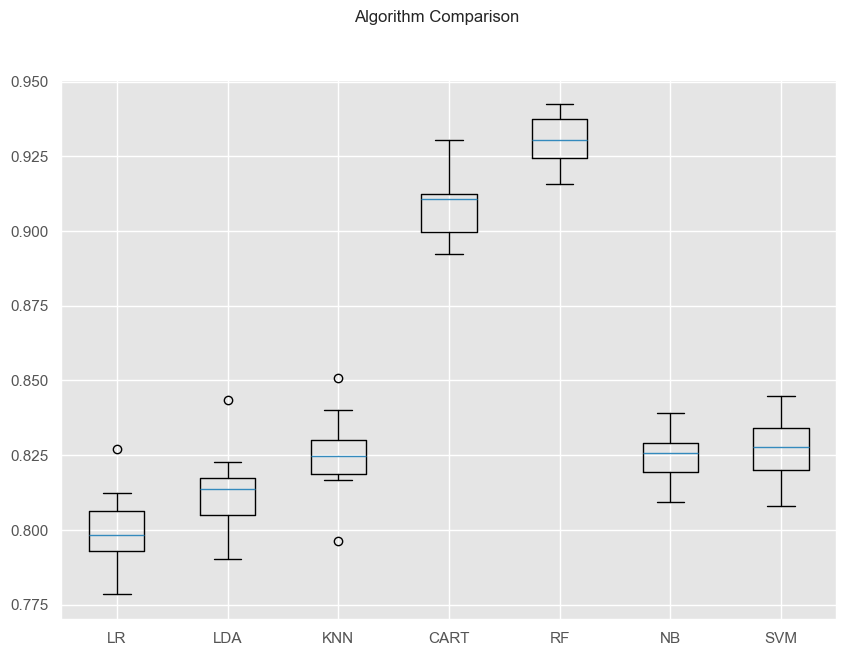

In [290]:
# prepare configuration for cross-validation test harness
seed = 7

# prepare models
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))

# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'

for name, model in models:
    kfold = model_selection.KFold(n_splits=10, shuffle=True, random_state=seed)
    cv_results = model_selection.cross_val_score(model, X_scaled, y, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = f'{name}, {cv_results.mean()}, {cv_results.std()}'
    print(msg)

# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

#### Based on the above result, RF happens to be the best model, we can go ahead and build our model based on this

In [292]:
# Spliting our historical dataset into train and test dataset

X_train, X_test, y_train, y_test = train_test_split(X_scaled, 

                                                    y, 

                                                    test_size = 0.2,

                                                    random_state = RANDOM_STATE)

In [293]:
# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Initialize GridSearchCV
# param_grid: This defines the parameters and their respective ranges/values to search over.
# GridSearchCV: This performs an exhaustive search over the specified parameter grid.
# cv=5: This specifies 5-fold cross-validation.
# n_jobs=-1: This uses all available CPU cores to speed up the computation.
# verbose=2: This provides detailed output about the progress of GridSearchCV.

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2)

# Fit the GridSearchCV to the data
grid_search.fit(X_train, y_train)

# Print the best parameters and best estimator
print("Best Parameters:", grid_search.best_params_)
print("Best Estimator:", grid_search.best_estimator_)

# Use the best estimator to make predictions
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
print("Classification Report:")
print(classification_report(y_test, y_pred))

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


C:\Users\emmas\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning:


1080 fits failed out of a total of 3240.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
625 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\emmas\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\emmas\anaconda3\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "C:\Users\emmas\anaconda3\Lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\emmas\anaconda3\Lib\site-pac

Best Parameters: {'bootstrap': False, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
Best Estimator: RandomForestClassifier(bootstrap=False, max_depth=20, min_samples_split=5,
                       random_state=42)
Accuracy: 0.9387001477104875
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.97      0.94       674
           1       0.97      0.90      0.94       680

    accuracy                           0.94      1354
   macro avg       0.94      0.94      0.94      1354
weighted avg       0.94      0.94      0.94      1354



In [294]:
 # classification report (use the imported module)
print(classification_report(y_test, y_pred, target_names=["non_churners", "churners"]))

              precision    recall  f1-score   support

non_churners       0.91      0.97      0.94       674
    churners       0.97      0.90      0.94       680

    accuracy                           0.94      1354
   macro avg       0.94      0.94      0.94      1354
weighted avg       0.94      0.94      0.94      1354



In [295]:
# lets take a look at our confusion matrix...
confusion_matrix(y_test, y_pred)

array([[657,  17],
       [ 66, 614]], dtype=int64)

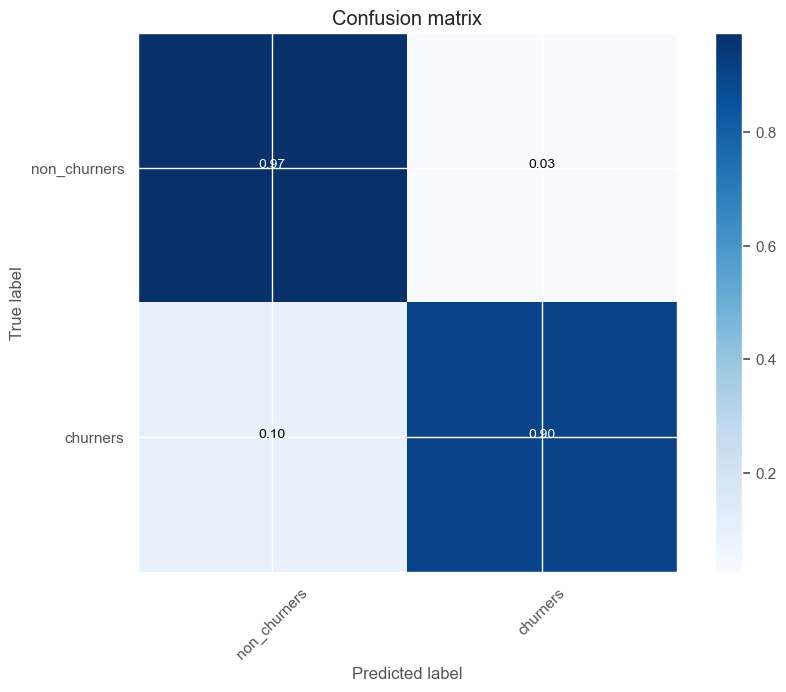

In [296]:
# put the confusion matrix into a nice plot
plot_confusion_matrix(confusion_matrix(y_test, y_pred), 
                      ["non_churners", "churners"])

Our model has improved with 94% accuracy and with better probability of predicting True positives (TP) and True negatives (TN)

### Saving our model to be used on our live data set 
Our live data set in this case is the non_churner_60 defined above.

In [299]:


# Save the best model
joblib.dump(best_rf, 'best_rf_model.joblib')


['best_rf_model.joblib']

In [300]:
# To use it


# Load the model
best_rf_loaded = joblib.load('best_rf_model.joblib')


## Using the model on our live data set

In [302]:
non_churners_60.head()

,CustomerKey,MaritalStatus,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Female
6671,17671,1,2,4,1,2,4,539.99,2013-06-13,0,332,1
12462,23462,1,4,1,2,3,2,539.99,2013-10-18,0,222,0
4336,15336,1,3,3,2,2,4,4.99,2014-01-20,0,144,0
2858,13858,1,5,4,2,2,2,9.99,2013-08-10,0,323,1
13869,24869,1,2,3,3,3,4,4.99,2013-09-23,0,244,0


In [303]:
# making a copy of the 60% non_churners to be used to do our analysis

non_churners_60_ = non_churners_60.copy()

To use the model on our live dataset (non_churners_60), they must have the same features
Need to do some data wranggling on the live data set before using the model on it.

In [305]:
# need to drop some columns first before we can use our model on it

col_to_drop = ['ChurnFlag', 'Income Segment', 'CustomerKey', 'OrderDate', 'TotalChildren']

df_live = non_churners_60.drop(col_to_drop, axis = 1)

df_live.head()

,MaritalStatus,Education,Occupation,Age Group,SalesAmount,RFM_Score,Female
6671,1,2,4,4,539.99,332,1
12462,1,4,1,2,539.99,222,0
4336,1,3,3,4,4.99,144,0
2858,1,5,4,2,9.99,323,1
13869,1,2,3,4,4.99,244,0


In [306]:
df_live.shape

(5074, 7)

In [307]:
df_live.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5074 entries, 6671 to 5755
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MaritalStatus  5074 non-null   int64  
 1   Education      5074 non-null   int64  
 2   Occupation     5074 non-null   int32  
 3   Age Group      5074 non-null   int64  
 4   SalesAmount    5074 non-null   float64
 5   RFM_Score      5074 non-null   int64  
 6   Female         5074 non-null   int64  
dtypes: float64(1), int32(1), int64(5)
memory usage: 297.3 KB


In [308]:
# To check for missing values using our missing value finder function derived earlier

missingValFinder(df_live)

['MaritalStatus has no missing records',
 'Education has no missing records',
 'Occupation has no missing records',
 'Age Group has no missing records',
 'SalesAmount has no missing records',
 'RFM_Score has no missing records',
 'Female has no missing records']

In [309]:
df_live.head()

,MaritalStatus,Education,Occupation,Age Group,SalesAmount,RFM_Score,Female
6671,1,2,4,4,539.99,332,1
12462,1,4,1,2,539.99,222,0
4336,1,3,3,4,4.99,144,0
2858,1,5,4,2,9.99,323,1
13869,1,2,3,4,4.99,244,0


In [310]:
X_test.head()

,MaritalStatus,Education,Occupation,Age Group,SalesAmount,RFM_Score,Female
1668,0.930574,-1.080397,0.508692,1.684752,-0.739289,-0.298190,1.007417
4966,0.930574,-1.080397,0.508692,0.007931,-0.739289,1.462653,-0.992637
484,0.930574,-0.241328,1.224393,0.007931,-0.755972,-0.491883,1.007417
432,-1.074606,1.436809,-0.922711,1.684752,1.273753,-0.500687,-0.992637
5189,0.930574,0.597740,1.224393,-0.830480,1.224306,0.476581,1.007417


##### We need to scale the live data set before we can use it for prediction

In [312]:
# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the data
scaled_df_live = scaler.fit_transform(df_live)

# Create a DataFrame with the scaled data
df_live_scaled = pd.DataFrame(scaled_df_live, columns=df_live.columns)

In [313]:
df_live_scaled.head()

,MaritalStatus,Education,Occupation,Age Group,SalesAmount,RFM_Score,Female
0,0.88479,-1.024790,1.169145,0.794730,0.220035,1.290882,1.010700
1,0.88479,0.628297,-0.968086,-0.849495,0.220035,-0.050671,-0.989414
2,0.88479,-0.198247,0.456735,0.794730,-0.542480,-1.001954,-0.989414
3,0.88479,1.454840,1.169145,-0.849495,-0.535354,1.181119,1.010700
4,0.88479,-1.024790,0.456735,0.794730,-0.542480,0.217640,-0.989414


In [314]:
# Make predictions
new_predictions = best_rf_loaded.predict(df_live_scaled)


In [315]:
new_predictions.shape


(5074,)

### Need to create a dataframe that has the predicted values concatenated to the live dataframe:

Need to reset the indices of both df_live and new_predictions so as to avoid NaN after converting the predicted values to a dataframe.

In [317]:
# Convert predicted_values in array type to DataFrame
new_predictions_df = pd.DataFrame(new_predictions, columns=['ChurnFlag'])




In [318]:
new_predictions_df.head()

,ChurnFlag
0,1
1,0
2,0
3,1
4,0


In [319]:
# Reset indices to ensure alignment
df_live_scaled.reset_index(drop=True, inplace=True)
new_predictions_df.reset_index(drop=True, inplace=True)

In [320]:
# Concatenate the predicted_values DataFrame to the live DataFrame
df_live_with_target = pd.concat([df_live_scaled, new_predictions_df], axis=1)

df_live_with_target.head()

,MaritalStatus,Education,Occupation,Age Group,SalesAmount,RFM_Score,Female,ChurnFlag
0,0.88479,-1.024790,1.169145,0.794730,0.220035,1.290882,1.010700,1
1,0.88479,0.628297,-0.968086,-0.849495,0.220035,-0.050671,-0.989414,0
2,0.88479,-0.198247,0.456735,0.794730,-0.542480,-1.001954,-0.989414,0
3,0.88479,1.454840,1.169145,-0.849495,-0.535354,1.181119,1.010700,1
4,0.88479,-1.024790,0.456735,0.794730,-0.542480,0.217640,-0.989414,0


In [321]:
df_live_with_target['ChurnFlag'].value_counts()

ChurnFlag
0    2985
1    2089
Name: count, dtype: int64

In [322]:
df_live_with_target['ChurnFlag'].unique()

array([1, 0], dtype=int64)

In [323]:
# calling our missing value finder to know whether there is no missing value after concatenating the 2 dataframes

missingValFinder(df_live_with_target)

['MaritalStatus has no missing records',
 'Education has no missing records',
 'Occupation has no missing records',
 'Age Group has no missing records',
 'SalesAmount has no missing records',
 'RFM_Score has no missing records',
 'Female has no missing records',
 'ChurnFlag has no missing records']

In [324]:
print(f'From the scored dataset, our model predicted that {(df_live_with_target['ChurnFlag'].sum()/len(df_live_with_target))*100}% would churn while {((len(df_live_with_target)-df_live_with_target['ChurnFlag'].sum())/len(df_live_with_target))*100}% would not churn')

From the scored dataset, our model predicted that 41.17067402443831% would churn while 58.82932597556169% would not churn


#### To calculate the avarage sales per year per customer that would be used for our recommendation

In [326]:
# calling the saved 60% non_churners

non_churners_60_.head()

,CustomerKey,MaritalStatus,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Female
6671,17671,1,2,4,1,2,4,539.99,2013-06-13,0,332,1
12462,23462,1,4,1,2,3,2,539.99,2013-10-18,0,222,0
4336,15336,1,3,3,2,2,4,4.99,2014-01-20,0,144,0
2858,13858,1,5,4,2,2,2,9.99,2013-08-10,0,323,1
13869,24869,1,2,3,3,3,4,4.99,2013-09-23,0,244,0


In [327]:
# we need to extract our year from our orderdate column so as to be able to cal the avg sales per year per customer



non_churners_60_['Year'] = non_churners_60_['OrderDate'].dt.year
print("\nDataFrame with Year Column:")

non_churners_60_.head()


DataFrame with Year Column:


,CustomerKey,MaritalStatus,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Female,Year
6671,17671,1,2,4,1,2,4,539.99,2013-06-13,0,332,1,2013
12462,23462,1,4,1,2,3,2,539.99,2013-10-18,0,222,0,2013
4336,15336,1,3,3,2,2,4,4.99,2014-01-20,0,144,0,2014
2858,13858,1,5,4,2,2,2,9.99,2013-08-10,0,323,1,2013
13869,24869,1,2,3,3,3,4,4.99,2013-09-23,0,244,0,2013


In [328]:
#Aggregate Revenue by Customer and Year

In [329]:
# Group by CustomerID and Year, then sum the Revenue
yearly_revenue = non_churners_60_.groupby(['CustomerKey', 'Year'])['SalesAmount'].sum().reset_index()
print("\nYearly Revenue by Customer:")
print(yearly_revenue)



Yearly Revenue by Customer:
      CustomerKey  Year  SalesAmount
0           11051  2013         8.99
1           11066  2013        35.00
2           11067  2014         4.99
3           11086  2013        34.99
4           11102  2013         7.95
...           ...   ...          ...
5069        29465  2013       742.35
5070        29468  2013      2384.07
5071        29470  2013        21.49
5072        29473  2013      2384.07
5073        29480  2013         8.99

[5074 rows x 3 columns]


In [330]:
# Calculate the Average Revenue per Customer per Year

In [331]:
# Group by CustomerID to calculate average revenue per year for each customer
average_revenue_per_year = yearly_revenue.groupby('CustomerKey')['SalesAmount'].mean().reset_index()
average_revenue_per_year.rename(columns={'SalesAmount': 'AverageRevenuePerYear'}, inplace=True)
print("\nAverage Revenue per Customer per Year:")
print(average_revenue_per_year)



Average Revenue per Customer per Year:
      CustomerKey  AverageRevenuePerYear
0           11051                   8.99
1           11066                  35.00
2           11067                   4.99
3           11086                  34.99
4           11102                   7.95
...           ...                    ...
5069        29465                 742.35
5070        29468                2384.07
5071        29470                  21.49
5072        29473                2384.07
5073        29480                   8.99

[5074 rows x 2 columns]


In [332]:
# Let's visualise the average rev per year per customer:

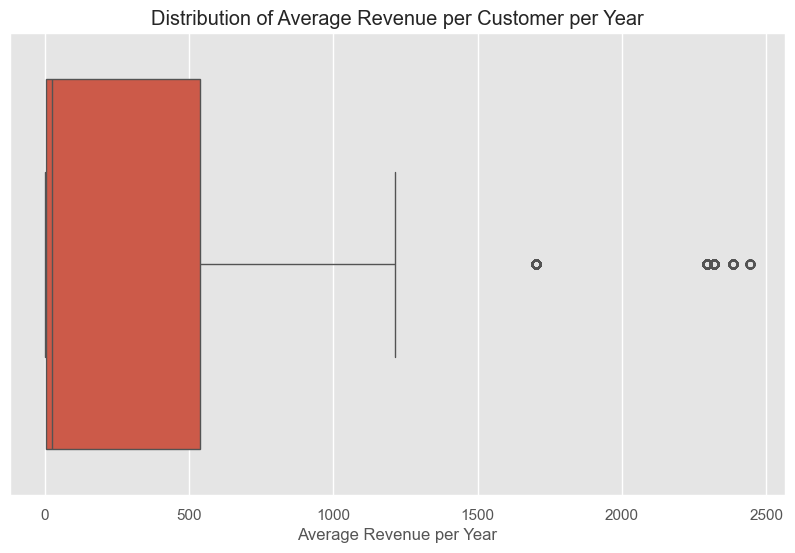

In [333]:
# Box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='AverageRevenuePerYear', data=average_revenue_per_year)
plt.title('Distribution of Average Revenue per Customer per Year')
plt.xlabel('Average Revenue per Year')
plt.show()



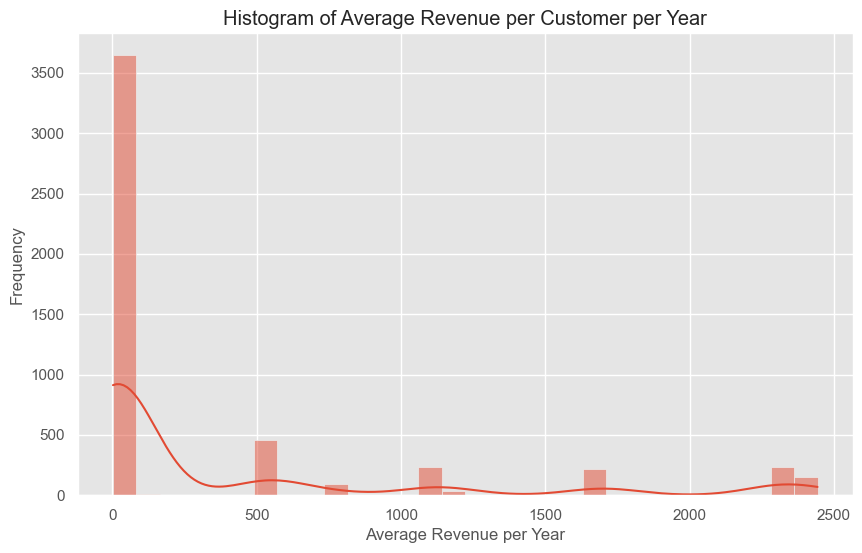

In [334]:
# Histogram
plt.figure(figsize=(10, 6))
sns.histplot(average_revenue_per_year['AverageRevenuePerYear'], bins=30, kde=True)
plt.title('Histogram of Average Revenue per Customer per Year')
plt.xlabel('Average Revenue per Year')
plt.ylabel('Frequency')
plt.show()



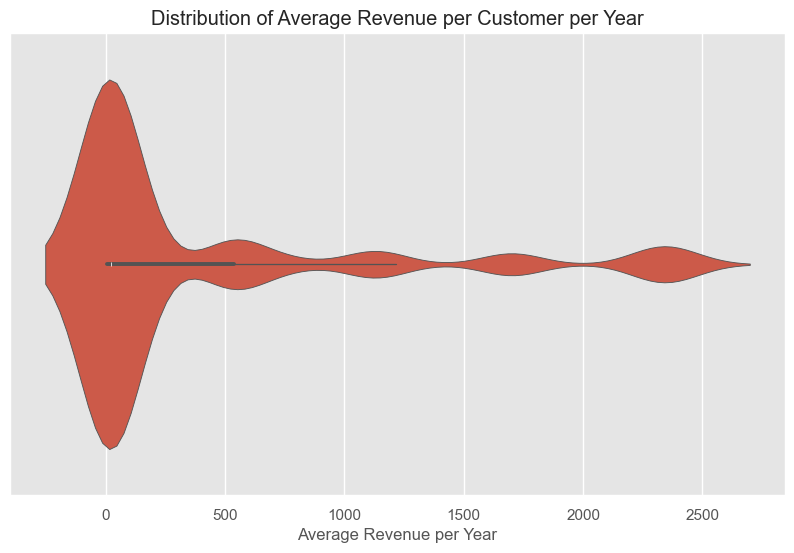

In [335]:
# Violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='AverageRevenuePerYear', data=average_revenue_per_year)
plt.title('Distribution of Average Revenue per Customer per Year')
plt.xlabel('Average Revenue per Year')
plt.show()



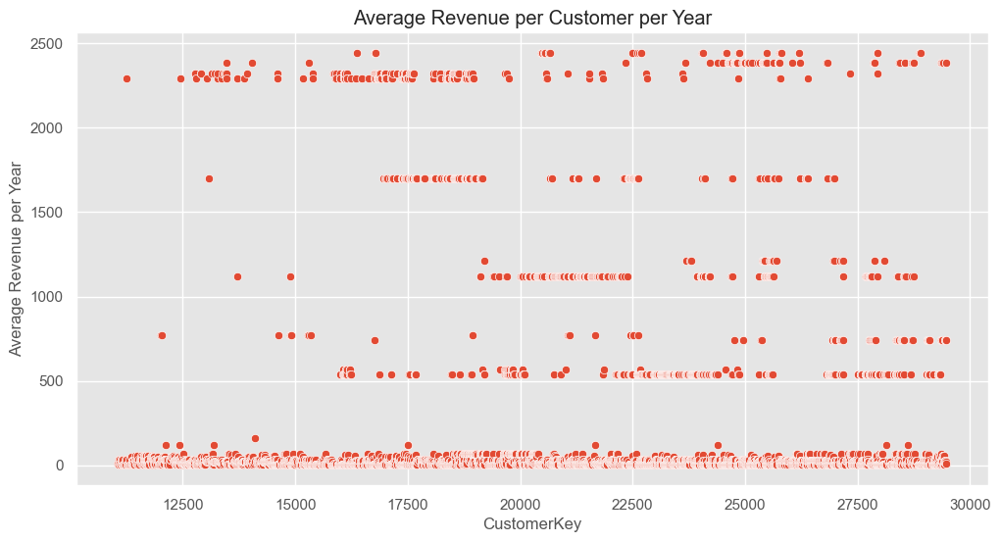

In [336]:
# Scatter plot
plt.figure(figsize=(12, 6))
sns.scatterplot(x='CustomerKey', y='AverageRevenuePerYear', data=average_revenue_per_year)
plt.title('Average Revenue per Customer per Year')
plt.xlabel('CustomerKey')
plt.ylabel('Average Revenue per Year')
plt.show()



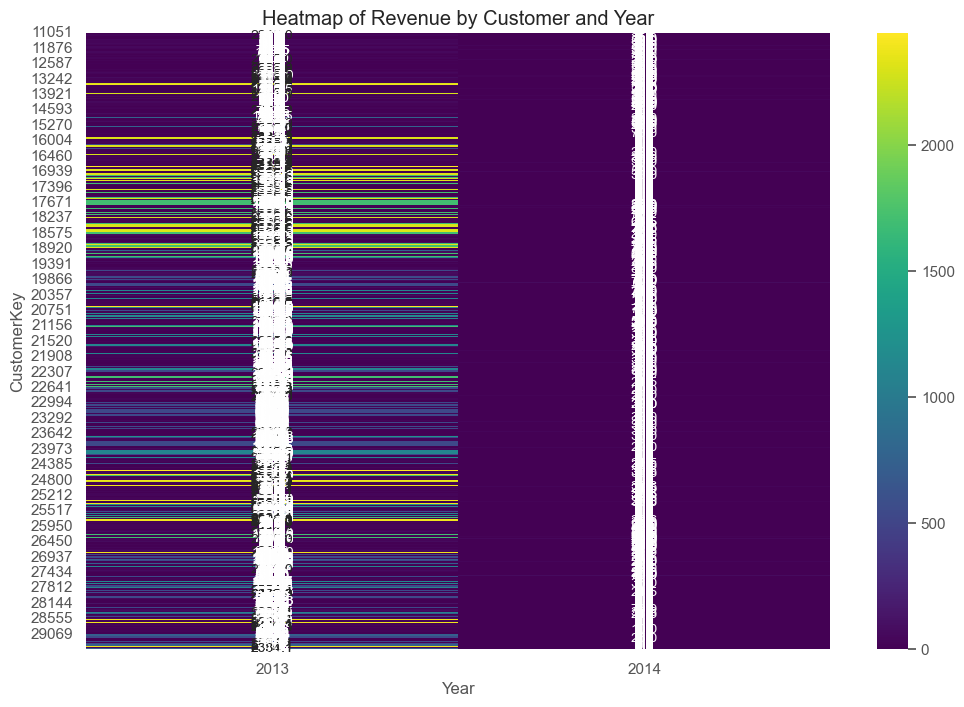

In [337]:
# Pivot the data for heatmap
pivot_table = yearly_revenue.pivot_table(index='CustomerKey', columns='Year', values='SalesAmount', fill_value=0)

# Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='viridis', annot=True, fmt=".1f")
plt.title('Heatmap of Revenue by Customer and Year')
plt.xlabel('Year')
plt.ylabel('CustomerKey')
plt.show()

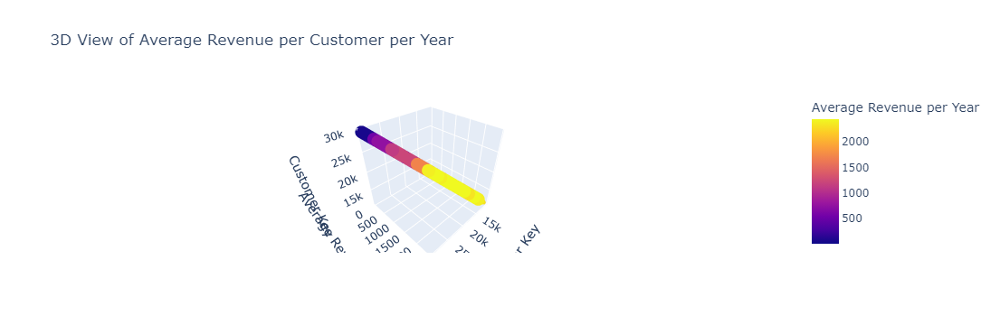

In [338]:
# 3D Scatter plot
fig = px.scatter_3d(
    average_revenue_per_year,
    x='CustomerKey',
    y='AverageRevenuePerYear',
    z='CustomerKey',
    color='AverageRevenuePerYear',
    labels={'CustomerKey': 'Customer Key', 'AverageRevenuePerYear': 'Average Revenue per Year'},
    title='3D View of Average Revenue per Customer per Year'
)

fig.show()

In [339]:
non_churners_60_.head()

,CustomerKey,MaritalStatus,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Female,Year
6671,17671,1,2,4,1,2,4,539.99,2013-06-13,0,332,1,2013
12462,23462,1,4,1,2,3,2,539.99,2013-10-18,0,222,0,2013
4336,15336,1,3,3,2,2,4,4.99,2014-01-20,0,144,0,2014
2858,13858,1,5,4,2,2,2,9.99,2013-08-10,0,323,1,2013
13869,24869,1,2,3,3,3,4,4.99,2013-09-23,0,244,0,2013


In [340]:
non_churners_60_['Year'].unique()

array([2013, 2014])

In [341]:
# Ensure the dataset contains the required columns: 'CustomerID' and 'Sales'
if 'CustomerKey' not in non_churners_60_.columns or 'SalesAmount' not in non_churners_60_.columns:
    raise ValueError("Dataset must contain 'CustomerKey' and 'SalesAmount' columns")

# Group by CustomerID and sum the Sales
customer_sales = non_churners_60_.groupby('CustomerKey')['SalesAmount'].sum()

# Calculate the average sales per customer
average_sales_per_customer = customer_sales.mean()

print(f'Average Sales per Customer: {average_sales_per_customer}')

Average Sales per Customer: 385.6079661016949


In [342]:
print(f'Total number of customers that churned from our scored data was {df_live_with_target['ChurnFlag'].value_counts()[1]}')

Total number of customers that churned from our scored data was 2089


In [343]:
print(f'Total revenue loss based on our scored data would be {2058 * 385.6079661016949}')

Total revenue loss based on our scored data would be 793581.1942372881
